# Predict Hospital Length of Stay (LOS) for Newborn 
* Admission Type = Newborn
* Healthcare Service Area = New York City
* Model Building on 10 sample data set

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')


In [2]:
# For Modellimg
from sklearn.preprocessing import OneHotEncoder
# Using Chi2 , Information Gain
from sklearn.feature_selection import chi2
from sklearn.feature_selection import SelectKBest
# For train / test split and data standardization
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

In [ ]:
# Intall pycaret for model creation and compare for best classification
# ! pip install pycaret

In [3]:
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 1000)
pd.set_option('display.width', 1000)

In [4]:
# Data Import of 2017 Year
df_newborn_2017=pd.read_csv("D:\Renu\Personal\Master DS\Thesis\SPARCS Data Set\SPARCS_NEWBORN_2017_CLEAN.csv")

In [5]:
# newborn 2017 data
df_newborn_2017.shape

(107366, 24)

In [6]:
df_newborn_2017.columns

Index(['Unnamed: 0', 'Hospital County', 'Facility Name', 'Age Group', 'Zip Code - 3 digits', 'Gender', 'Race', 'Ethnicity', 'Length of Stay', 'Patient Disposition', 'Discharge Year', 'CCS Diagnosis Description', 'CCS Procedure Description', 'APR DRG Description', 'APR MDC Description', 'APR Severity of Illness Description', 'APR Risk of Mortality', 'APR Medical Surgical Description', 'Payment Typology 1', 'Birth Weight', 'Abortion Edit Indicator', 'Emergency Department Indicator', 'Total Charges', 'Total Costs'], dtype='object')

In [7]:
df_newborn_2017.drop(columns=['Unnamed: 0','Discharge Year'],inplace=True)

# Experiments

*  Model building only on 2017 dataset of newborn.
* Filter : New York City , Newborn
*  Extract features and importance
* 1. Classify LOS as Low <2, Med 2 to 3 & High > 3 . This is done based on data distribution 75% of data is having LOS as 3
* Utilize pycarat for quick basic model creation and comparision
* Selected Model for Manual creation



## Feature Extraction
* Working on 2017 Dataset
* One hot encoding for categorical values
* Using - Correlation , CHI2 methods 



In [8]:
df_newborn_2017.head()

,Hospital County,Facility Name,Age Group,Zip Code - 3 digits,Gender,Race,Ethnicity,Length of Stay,Patient Disposition,CCS Diagnosis Description,CCS Procedure Description,APR DRG Description,APR MDC Description,APR Severity of Illness Description,APR Risk of Mortality,APR Medical Surgical Description,Payment Typology 1,Birth Weight,Abortion Edit Indicator,Emergency Department Indicator,Total Charges,Total Costs
0,Manhattan,Mount Sinai Beth Israel,0 to 17,112,F,Other Race,Not Span/Hispanic,4,Home or Self Care,Liveborn,OPHTHALM-/OT-OLOGIC DX,"Neonate bwt 2000-2499g, normal newborn or neon...",Newborns and Other Neonates with Conditions Or...,Moderate,Minor,Medical,Medicaid,2400,N,N,16435.00,1720.74
1,Manhattan,Mount Sinai Beth Israel,0 to 17,112,F,Other Race,Not Span/Hispanic,4,Home or Self Care,Liveborn,OPHTHALM-/OT-OLOGIC DX,Neonate bwt 2000-2499g w resp dist synd/oth ma...,Newborns and Other Neonates with Conditions Or...,Minor,Minor,Medical,Medicaid,2100,N,N,23201.15,2553.12
2,Manhattan,Mount Sinai Beth Israel,0 to 17,100,F,White,Not Span/Hispanic,1,Home or Self Care,Liveborn,OPHTHALM-/OT-OLOGIC DX,"Neonate birthwt >2499g, normal newborn or neon...",Newborns and Other Neonates with Conditions Or...,Minor,Minor,Medical,Private Health Insurance,3400,N,N,4205.00,438.67
3,Manhattan,Mount Sinai Beth Israel,0 to 17,NaN,M,Other Race,Unknown,2,Home or Self Care,Liveborn,OPHTHALM-/OT-OLOGIC DX,"Neonate birthwt >2499g, normal newborn or neon...",Newborns and Other Neonates with Conditions Or...,Minor,Minor,Medical,Private Health Insurance,3300,N,N,9165.00,943.90
4,Manhattan,Mount Sinai Hospital,0 to 17,104,M,Other Race,Not Span/Hispanic,20,Home or Self Care,Liveborn,RESP INTUB/MECH VENTIL,Neonate bwt 2000-2499g w major anomaly,Newborns and Other Neonates with Conditions Or...,Major,Moderate,Medical,Medicaid,2200,N,N,213770.86,89779.95


In [9]:
# initoate onehot encoding
oe=OneHotEncoder()

In [10]:
# For all categorical columns 
col_category=df_newborn_2017.select_dtypes(include='object').columns
col_numeric=df_newborn_2017.select_dtypes(exclude='object').columns

In [11]:
col_category

Index(['Hospital County', 'Facility Name', 'Age Group', 'Zip Code - 3 digits', 'Gender', 'Race', 'Ethnicity', 'Patient Disposition', 'CCS Diagnosis Description', 'CCS Procedure Description', 'APR DRG Description', 'APR MDC Description', 'APR Severity of Illness Description', 'APR Risk of Mortality', 'APR Medical Surgical Description', 'Payment Typology 1', 'Abortion Edit Indicator', 'Emergency Department Indicator'], dtype='object')

In [12]:
# One hot encoding for each category field
for i in enumerate(col_category):
    df=pd.get_dummies(df_newborn_2017[i[1]],drop_first=True,prefix=i[1])
    df_newborn_2017=pd.concat([df_newborn_2017,df],axis=1)

In [13]:
df_newborn_2017.columns

Index(['Hospital County', 'Facility Name', 'Age Group', 'Zip Code - 3 digits', 'Gender', 'Race', 'Ethnicity', 'Length of Stay', 'Patient Disposition', 'CCS Diagnosis Description',
       ...
       'APR Medical Surgical Description_Surgical', 'Payment Typology 1_Federal/State/Local/VA', 'Payment Typology 1_Managed Care, Unspecified', 'Payment Typology 1_Medicaid', 'Payment Typology 1_Medicare', 'Payment Typology 1_Miscellaneous/Other', 'Payment Typology 1_Private Health Insurance', 'Payment Typology 1_Self-Pay', 'Payment Typology 1_Unknown', 'Emergency Department Indicator_Y'], dtype='object', length=316)

In [14]:
# Drop categorical columns
df_newborn_2017.drop( columns=col_category, inplace=True)
#df_all.drop( columns=col_category, inplace=True)

In [15]:
df_newborn_2017.shape
# 299 attributes after one hor encoding

(107366, 298)

In [16]:
# Getting Column List
col=list(df_newborn_2017.columns)

In [17]:
col

['Length of Stay',
 'Birth Weight',
 'Total Charges',
 'Total Costs',
 'Hospital County_Kings',
 'Hospital County_Manhattan',
 'Hospital County_Queens',
 'Hospital County_Richmond',
 'Facility Name_Bronx-Lebanon Hospital Center - Concourse Division',
 'Facility Name_Brookdale Hospital Medical Center',
 'Facility Name_Brooklyn Hospital Center - Downtown Campus',
 "Facility Name_Cohen Children's Medical Center",
 'Facility Name_Coney Island Hospital',
 'Facility Name_Elmhurst Hospital Center',
 'Facility Name_Flushing Hospital Medical Center',
 'Facility Name_Harlem Hospital Center',
 'Facility Name_Jacobi Medical Center',
 'Facility Name_Jamaica Hospital Medical Center',
 'Facility Name_Kings County Hospital Center',
 'Facility Name_Lenox Hill Hospital',
 'Facility Name_Lincoln Medical & Mental Health Center',
 'Facility Name_Long Island Jewish Forest Hills',
 'Facility Name_Maimonides Medical Center',
 'Facility Name_Metropolitan Hospital Center',
 'Facility Name_Montefiore Med Center 

In [18]:
# Looking at correlation 
df_corr=df_newborn_2017.corr().round(2)
df_corr

,Length of Stay,Birth Weight,Total Charges,Total Costs,Hospital County_Kings,Hospital County_Manhattan,Hospital County_Queens,Hospital County_Richmond,Facility Name_Bronx-Lebanon Hospital Center - Concourse Division,Facility Name_Brookdale Hospital Medical Center,Facility Name_Brooklyn Hospital Center - Downtown Campus,Facility Name_Cohen Children's Medical Center,Facility Name_Coney Island Hospital,Facility Name_Elmhurst Hospital Center,Facility Name_Flushing Hospital Medical Center,Facility Name_Harlem Hospital Center,Facility Name_Jacobi Medical Center,Facility Name_Jamaica Hospital Medical Center,Facility Name_Kings County Hospital Center,Facility Name_Lenox Hill Hospital,Facility Name_Lincoln Medical & Mental Health Center,Facility Name_Long Island Jewish Forest Hills,Facility Name_Maimonides Medical Center,Facility Name_Metropolitan Hospital Center,Facility Name_Montefiore Med Center - Jack D Weiler Hosp of A Einstein College Div,Facility Name_Montefiore Medical Center - Henry & Lucy Moses Div,Facility Name_Montefiore Medical Center-Wakefield Hospital,Facility Name_Mount Sinai Beth Israel,Facility Name_Mount Sinai Hospital,Facility Name_Mount Sinai West,Facility Name_NYU Langone Hospital-Brooklyn,Facility Name_NYU Langone Hospitals,Facility Name_New York - Presbyterian Brooklyn Methodist Hospital,Facility Name_New York - Presbyterian/Queens,Facility Name_New York Presbyterian Hospital - Allen Hospital,Facility Name_New York Presbyterian Hospital - Columbia Presbyterian Center,Facility Name_New York Presbyterian Hospital - New York Weill Cornell Center,Facility Name_New York-Presbyterian/Lower Manhattan Hospital,Facility Name_North Central Bronx Hospital,Facility Name_Queens Hospital Center,Facility Name_Richmond University Medical Center,Facility Name_SBH Health System,Facility Name_St Johns Episcopal Hospital So Shore,Facility Name_Staten Island University Hosp-North,Facility Name_University Hospital of Brooklyn,Facility Name_Woodhull Medical & Mental Health Center,Facility Name_Wyckoff Heights Medical Center,Zip Code - 3 digits_101,Zip Code - 3 digits_103,Zip Code - 3 digits_104,Zip Code - 3 digits_105,Zip Code - 3 digits_106,Zip Code - 3 digits_107,Zip Code - 3 digits_108,Zip Code - 3 digits_109,Zip Code - 3 digits_110,Zip Code - 3 digits_111,Zip Code - 3 digits_112,Zip Code - 3 digits_113,Zip Code - 3 digits_114,Zip Code - 3 digits_115,Zip Code - 3 digits_116,Zip Code - 3 digits_117,Zip Code - 3 digits_118,Zip Code - 3 digits_119,Zip Code - 3 digits_121,Zip Code - 3 digits_124,Zip Code - 3 digits_125,Zip Code - 3 digits_127,Zip Code - 3 digits_130,Zip Code - 3 digits_OOS,Gender_M,Race_Multi-racial,Race_Other Race,Race_White,Ethnicity_Not Span/Hispanic,Ethnicity_Spanish/Hispanic,Ethnicity_Unknown,Patient Disposition_Cancer Center or Children's Hospital,Patient Disposition_Court/Law Enforcement,Patient Disposition_Critical Access Hospital,Patient Disposition_Expired,Patient Disposition_Facility w/ Custodial/Supportive Care,Patient Disposition_Federal Health Care Facility,Patient Disposition_Home or Self Care,Patient Disposition_Home w/ Home Health Services,Patient Disposition_Hospice - Home,Patient Disposition_Hospice - Medical Facility,Patient Disposition_Inpatient Rehabilitation Facility,Patient Disposition_Left Against Medical Advice,Patient Disposition_Medicaid Cert Nursing Facility,Patient Disposition_Medicare Cert Long Term Care Hospital,Patient Disposition_Psychiatric Hospital or Unit of Hosp,Patient Disposition_Short-term Hospital,Patient Disposition_Skilled Nursing Home,CCS Diagnosis Description_Acute bronchitis,CCS Diagnosis Description_Adjustment disorders,CCS Diagnosis Description_Birth trauma,CCS Diagnosis Description_Cardiac and circulatory congenital anomalies,CCS Diagnosis Description_Cardiac dysrhythmias,CCS Diagnosis Description_Complication of device; implant or graft,CCS Diagnosis Description_Complications of surgical procedures or medical care,CCS Diagnosis Description_Digestive congenital anomalie

In [20]:
# Exporting Corr data for better view
df_corr.to_csv("D:\Renu\Personal\Master DS\Thesis\SPARCS Data Set\corr.csv")

In [21]:
import numpy as np
# Select upper triangle of correlation matrix
upper = df_corr.where(np.triu(np.ones(df_corr.shape), k=1).astype(np.bool))

# Find features with correlation greater than 0.7
to_drop = [column for column in upper.columns if any(upper[column] > 0.7)]
to_drop_neg = [column for column in upper.columns if any(upper[column] < -0.4)]


In [22]:
to_drop

['Total Charges',
 'Total Costs',
 'Zip Code - 3 digits_103',
 'CCS Procedure Description_APPENDECTOMY',
 'CCS Procedure Description_OT OR THER PRC ON JOINT',
 'CCS Procedure Description_PSYCHO/PSYCHI EVAL/THER',
 'APR DRG Description_Bronchiolitis & RSV pneumonia',
 'APR DRG Description_Heart &/or lung transplant',
 'APR DRG Description_Liver transplant &/or intestinal transplant',
 'APR DRG Description_Neonate w ECMO',
 'APR DRG Description_Neonate, transferred < 5 days old, born here',
 'APR DRG Description_Other complications of treatment',
 'APR DRG Description_Other ear, nose, mouth,throat & cranial/facial diagnoses',
 'APR DRG Description_Other nervous system & related procedures',
 'APR DRG Description_Other significant hip and femur surgery',
 'APR DRG Description_Tonsil & adenoid procedures',
 'APR MDC Description_Diseases and Disorders of the Musculoskeletal System and Conn Tissue',
 'APR MDC Description_Diseases and Disorders of the Nervous System',
 'APR MDC Description_Ea

In [23]:
to_drop_neg

['Birth Weight',
 'Hospital County_Manhattan',
 'Hospital County_Queens',
 'Race_White',
 'Ethnicity_Spanish/Hispanic',
 'Ethnicity_Unknown',
 'Patient Disposition_Home w/ Home Health Services',
 'CCS Diagnosis Description_Other perinatal conditions',
 'CCS Diagnosis Description_Short gestation; low birth weight; and fetal growth retardation',
 'CCS Procedure Description_PROPHYLACTIC VAC/INOCUL',
 'APR DRG Description_Neonate bwt 2000-2499g, normal newborn or neonate w other problem',
 'APR MDC Description_Newborns and Other Neonates with Conditions Originating in the Perinatal Period',
 'APR MDC Description_Pre-MDC or Ungroupable',
 'APR Severity of Illness Description_Minor',
 'APR Severity of Illness Description_Moderate',
 'APR Severity of Illness Description_N',
 'APR Risk of Mortality_Minor',
 'APR Risk of Mortality_Moderate',
 'Payment Typology 1_Private Health Insurance']

In [24]:
df_newborn_2017['Length of Stay'].describe()
# 75% data is 3 days for LOS , only 25% data is above 3

count    107366.000000
mean          3.925181
std           8.536898
min           1.000000
25%           2.000000
50%           2.000000
75%           3.000000
max         120.000000
Name: Length of Stay, dtype: float64

In [25]:
df_newborn_2017.value_counts('Length of Stay')

Length of Stay
2      56749
3      29741
4       5992
1       4975
5       1779
6       1167
7       1011
8        626
9        421
10       370
11       346
12       268
13       258
15       231
14       216
16       159
17       146
18       146
19       134
21       122
20       121
120      120
22       106
23        90
24        86
27        80
25        74
30        62
31        60
26        58
28        58
35        57
36        56
29        53
32        52
33        50
34        47
42        45
37        44
44        42
48        42
45        41
40        38
39        38
41        37
38        33
47        33
46        31
49        31
52        30
43        28
51        24
58        23
50        23
56        23
53        22
57        22
64        21
62        21
55        20
60        20
63        20
65        19
66        19
69        18
68        17
67        17
59        16
76        15
79        15
73        14
86        14
54        13
83        13
61        13
84        

In [26]:
# Class Division into 3 classes -- Low(0) , Med(1) and High(2)
# 75% of data itself is within LOS 3 , so dividing class as  Low <=2 , Med= >2 and <=5 , high >5
df_newborn_2017['LOS Class 1']=df_newborn_2017["Length of Stay"].apply(lambda x:
                                               0 if x<=2  else (1 if x>2 and x<=5 else 2) )

In [27]:
df_newborn_2017[['LOS Class 1','Length of Stay']].head(15)

,LOS Class 1,Length of Stay
0,1,4
1,1,4
2,0,1
3,0,2
4,2,20
5,2,9
6,0,2
7,0,2
8,0,2
9,0,2


In [28]:
# Binary class due to 75% of data is 3 as  Low <=3 and High >3
df_newborn_2017['LOS Class 2']=df_newborn_2017["Length of Stay"].apply(lambda x:
                                               0 if x<=3  else 1 )

In [29]:
df_newborn_2017['LOS Class 1'].value_counts()

0    61724
1    37512
2     8130
Name: LOS Class 1, dtype: int64

In [30]:
df_newborn_2017['LOS Class 2'].value_counts()

0    91465
1    15901
Name: LOS Class 2, dtype: int64

In [31]:
# Class 1 Avg LOS
df_newborn_2017.groupby(['LOS Class 1'])['Length of Stay'].mean()

LOS Class 1
0     1.919399
1     3.254585
2    22.247478
Name: Length of Stay, dtype: float64

### Feature Importance  Using Chi2 Score 
* Selecting top 25 features on 2017

In [32]:
# For Class 1 data sampling and preparing unseen data
data = df_newborn_2017.sample(frac=0.10, random_state=0)
data_unseen = df_newborn_2017.drop(data.index)

data.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))


Data for Modeling: (10737, 300)
Unseen Data For Predictions: (96629, 300)


In [33]:
data['LOS Class 1'].value_counts()

0    6099
1    3841
2     797
Name: LOS Class 1, dtype: int64

In [34]:
data_unseen['LOS Class 1'].value_counts()

0    55625
1    33671
2     7333
Name: LOS Class 1, dtype: int64

In [35]:
data_unseen['LOS Class 2'].value_counts()

0    82321
1    14308
Name: LOS Class 2, dtype: int64

In [36]:
# Train Test Split
y=data['LOS Class 1']
# Dropping highly correlated columns 
#Total Charges and Costs are similar features which are highly correlated, so only keeping total charges
X=data.drop(columns=['LOS Class 1','LOS Class 2','Length of Stay','Total Costs'])

X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=.30,random_state=42,stratify=y)

In [37]:
X_train.shape , X_test.shape

((7515, 296), (3222, 296))

In [38]:
pd.DataFrame(y_train)['LOS Class 1'].value_counts()

0    4269
1    2688
2     558
Name: LOS Class 1, dtype: int64

In [39]:
pd.DataFrame(y_test)['LOS Class 1'].value_counts()

0    1830
1    1153
2     239
Name: LOS Class 1, dtype: int64

In [40]:
# Selectinf Top 25 features
best=SelectKBest(chi2,k=25)
best_features=best.fit_transform(X_train,y_train)

In [41]:
cols = best.get_support(indices=True)
features_df_new = X_train.iloc[:,cols]

In [42]:
l=features_df_new.columns

In [59]:
impcol=list(l)
col25=list(l)

In [44]:
# Important Features
impcol

['Birth Weight',
 'Total Charges',
 'Patient Disposition_Home w/ Home Health Services',
 'CCS Procedure Description_ENTERAL/PARENTERAL NUTR',
 'CCS Procedure Description_OTHER THERAPEUTIC PRCS',
 'CCS Procedure Description_RESP INTUB/MECH VENTIL',
 'APR DRG Description_Neonate birthwt 1500-1999g w major anomaly',
 'APR DRG Description_Neonate birthwt 750-999g w/o major procedure',
 'APR DRG Description_Neonate birthwt >2499g w congenital/perinatal infection',
 'APR DRG Description_Neonate birthwt >2499g, normal newborn or neonate w other problem',
 'APR DRG Description_Neonate bwt 1000-1249g w resp dist synd/oth maj resp or maj anom',
 'APR DRG Description_Neonate bwt 1250-1499g w or w/o other significant condition',
 'APR DRG Description_Neonate bwt 1250-1499g w resp dist synd/oth maj resp or maj anom',
 'APR DRG Description_Neonate bwt 1500-1999g w or w/o other significant condition',
 'APR DRG Description_Neonate bwt 1500-1999g w resp dist synd/oth maj resp cond',
 'APR DRG Descript

In [83]:
impcol.append('LOS Class 1')

## Experiment 1 - pycaret - Classification   on Three Classes Low , Med and High

In [46]:
from pycaret.classification import *

In [47]:
# Setting up model for LOS Class 1
# Setting train test split based on stratify True
# fix data imbalance using SMOTE
cls = setup(data[impcol], target='LOS Class 1',fix_imbalance=True,data_split_stratify=True,fold=5)

,Description,Value
0,session_id,6980
1,Target,LOS Class 1
2,Target Type,Multiclass
3,Label Encoded,None
4,Original Data,"(10737, 26)"
5,Missing Values,False
6,Numeric Features,25
7,Categorical Features,0
8,Ordinal Features,False
9,High Cardinality Features,False


In [ ]:
# Creating Models

In [48]:
dt=create_model('dt')
dt

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7751,0.7999,0.7710,0.7794,0.7767,0.5926,0.5932
1,0.7864,0.8022,0.7918,0.7857,0.7855,0.6084,0.6088
2,0.7725,0.7976,0.7527,0.7775,0.7743,0.5867,0.5876
3,0.7884,0.8131,0.7844,0.7922,0.7895,0.6173,0.6177
4,0.7898,0.8157,0.7985,0.7944,0.7906,0.6212,0.6219
Mean,0.7824,0.8057,0.7797,0.7858,0.7833,0.6052,0.6058
Std,0.0072,0.0073,0.0163,0.0067,0.0067,0.0135,0.0134


DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=6980, splitter='best')

In [49]:
rf=create_model('rf')
rf

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7937,0.9038,0.7901,0.7974,0.7951,0.6254,0.6260
1,0.8104,0.8974,0.8205,0.8108,0.8106,0.6527,0.6527
2,0.8077,0.9041,0.8013,0.8109,0.8089,0.6499,0.6505
3,0.8144,0.9100,0.8210,0.8149,0.8145,0.6608,0.6608
4,0.8150,0.9107,0.8227,0.8148,0.8140,0.6616,0.6622
Mean,0.8083,0.9052,0.8111,0.8098,0.8086,0.6501,0.6505
Std,0.0077,0.0048,0.0131,0.0064,0.0071,0.0131,0.0130


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=6980, verbose=0,
                       warm_start=False)

In [50]:
knn=create_model('knn')
knn

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7871,0.8733,0.7901,0.7950,0.7895,0.6182,0.6195
1,0.7838,0.8709,0.7930,0.7898,0.7854,0.6113,0.6122
2,0.7791,0.8735,0.7794,0.7869,0.7815,0.6039,0.6052
3,0.7977,0.8785,0.8058,0.8016,0.7990,0.6342,0.6349
4,0.8037,0.8859,0.8164,0.8068,0.8035,0.6449,0.6458
Mean,0.7903,0.8764,0.7969,0.7960,0.7918,0.6225,0.6235
Std,0.0091,0.0053,0.0129,0.0074,0.0083,0.0150,0.0149


KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
                     weights='uniform')

In [51]:
exp1_dt=tune_model(dt,fold=5)
exp1_dt

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8230,0.8951,0.8246,0.8301,0.8250,0.6817,0.6835
1,0.8310,0.9087,0.8287,0.8322,0.8315,0.6914,0.6916
2,0.8177,0.9009,0.8080,0.8242,0.8197,0.6711,0.6727
3,0.8350,0.9044,0.8335,0.8358,0.8352,0.6988,0.6989
4,0.8403,0.9085,0.8468,0.8432,0.8408,0.7107,0.7112
Mean,0.8294,0.9035,0.8283,0.8331,0.8304,0.6908,0.6916
Std,0.0081,0.0051,0.0126,0.0063,0.0074,0.0136,0.0131


DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=14, max_features=1.0, max_leaf_nodes=None,
                       min_impurity_decrease=0.0002, min_impurity_split=None,
                       min_samples_leaf=4, min_samples_split=7,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=6980, splitter='best')

In [52]:
exp1_rf=tune_model(rf,fold=5)
exp1_rf

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7485,0.8547,0.7617,0.7466,0.7469,0.5388,0.5392
1,0.7764,0.8788,0.8035,0.7757,0.7759,0.5908,0.5908
2,0.7705,0.8705,0.7801,0.7723,0.7710,0.5828,0.5830
3,0.7791,0.8781,0.7950,0.7784,0.7786,0.5949,0.5950
4,0.7884,0.8823,0.8112,0.7877,0.7874,0.6141,0.6144
Mean,0.7726,0.8729,0.7903,0.7721,0.7720,0.5843,0.5845
Std,0.0134,0.0099,0.0176,0.0138,0.0136,0.0250,0.0249


RandomForestClassifier(bootstrap=False, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='entropy',
                       max_depth=10, max_features='log2', max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0,
                       min_impurity_split=None, min_samples_leaf=6,
                       min_samples_split=9, min_weight_fraction_leaf=0.0,
                       n_estimators=80, n_jobs=-1, oob_score=False,
                       random_state=6980, verbose=0, warm_start=False)

In [53]:
exp1_knn=tune_model(knn,fold=5)
exp1_knn

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7971,0.9036,0.8075,0.8063,0.7996,0.6375,0.6391
1,0.8031,0.9056,0.8225,0.8097,0.8045,0.6469,0.6480
2,0.8071,0.9051,0.8023,0.8132,0.8090,0.6527,0.6536
3,0.8217,0.9101,0.8360,0.8268,0.8230,0.6792,0.6802
4,0.8130,0.9114,0.8334,0.8173,0.8127,0.6624,0.6637
Mean,0.8084,0.9072,0.8203,0.8147,0.8098,0.6557,0.6569
Std,0.0084,0.0030,0.0135,0.0071,0.0080,0.0143,0.0141


KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=28, p=2,
                     weights='distance')

In [54]:
predict_model(exp1_dt)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Decision Tree Classifier,0.8271,0.9062,0.8141,0.8299,0.8280,0.6860,0.6863


,Birth Weight,Total Charges,Patient Disposition_Home w/ Home Health Services,CCS Procedure Description_ENTERAL/PARENTERAL NUTR,CCS Procedure Description_OTHER THERAPEUTIC PRCS,CCS Procedure Description_RESP INTUB/MECH VENTIL,APR DRG Description_Neonate birthwt 1500-1999g w major anomaly,APR DRG Description_Neonate birthwt 750-999g w/o major procedure,APR DRG Description_Neonate birthwt >2499g w congenital/perinatal infection,APR DRG Description_Neonate birthwt >2499g normal newborn or neonate w other problem,...,APR DRG Description_Neonate bwt <1500g w major procedure,APR DRG Description_Neonate birthwt >2499g w resp dist synd/oth maj resp cond,APR Severity of Illness Description_Major,APR Severity of Illness Description_Minor,APR Risk of Mortality_Major,APR Risk of Mortality_Moderate,APR Medical Surgical Description_Surgical,LOS Class 1,Label,Score
0,2000.0,5149.410156,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.9521
1,3600.0,17013.960938,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,0,0,0.8077
2,2700.0,25878.849609,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,1,1,0.9698
3,3000.0,11223.759766,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,1,0,0.8939
4,3600.0,10537.379883,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,0,0,0.9409
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3217,2900.0,14765.719727,0,0,0,1,0,0,0,1,...,0,0,1,0,0,0,0,1,1,0.9577
3218,3600.0,9880.629883,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,0,0,0.8819
3219,4500.0,10990.719727,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,0,0,0.9011
3220,2900.0,10098.360352,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,0,0,0.9409


In [63]:
predict_model(exp1_dt,data=data_unseen)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Decision Tree Classifier,0.8234,0.9086,0.8188,0.8257,0.8240,0.6778,0.6781


,Length of Stay,Birth Weight,Total Charges,Total Costs,Hospital County_Kings,Hospital County_Manhattan,Hospital County_Queens,Hospital County_Richmond,Facility Name_Bronx-Lebanon Hospital Center - Concourse Division,Facility Name_Brookdale Hospital Medical Center,...,Payment Typology 1_Medicare,Payment Typology 1_Miscellaneous/Other,Payment Typology 1_Private Health Insurance,Payment Typology 1_Self-Pay,Payment Typology 1_Unknown,Emergency Department Indicator_Y,LOS Class 1,LOS Class 2,Label,Score
0,4,2400,16435.00,1720.74,0,1,0,0,0,0,...,0,0,0,0,0,0,1,1,1,0.7800
1,4,2100,23201.15,2553.12,0,1,0,0,0,0,...,0,0,0,0,0,0,1,1,0,0.5714
2,1,3400,4205.00,438.67,0,1,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0.8400
3,20,2200,213770.86,89779.95,0,1,0,0,0,0,...,0,0,0,0,0,0,2,1,2,0.9971
4,9,1800,95689.76,40145.55,0,1,0,0,0,0,...,0,0,1,0,0,0,2,1,2,0.9971
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96624,2,2800,9959.72,1510.93,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0.9409
96625,13,1600,192543.12,32271.66,0,0,1,0,0,0,...,0,0,1,0,0,0,2,1,2,0.9971
96626,2,3100,11000.36,1643.23,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0.9011
96627,2,2400,10594.70,1930.85,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0.9409


In [64]:
predict_model(exp1_rf)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Random Forest Classifier,0.7669,0.8713,0.7733,0.7654,0.7658,0.5720,0.5722


,Birth Weight,Total Charges,Patient Disposition_Home w/ Home Health Services,CCS Procedure Description_ENTERAL/PARENTERAL NUTR,CCS Procedure Description_OTHER THERAPEUTIC PRCS,CCS Procedure Description_RESP INTUB/MECH VENTIL,APR DRG Description_Neonate birthwt 1500-1999g w major anomaly,APR DRG Description_Neonate birthwt 750-999g w/o major procedure,APR DRG Description_Neonate birthwt >2499g w congenital/perinatal infection,APR DRG Description_Neonate birthwt >2499g normal newborn or neonate w other problem,...,APR DRG Description_Neonate bwt <1500g w major procedure,APR DRG Description_Neonate birthwt >2499g w resp dist synd/oth maj resp cond,APR Severity of Illness Description_Major,APR Severity of Illness Description_Minor,APR Risk of Mortality_Major,APR Risk of Mortality_Moderate,APR Medical Surgical Description_Surgical,LOS Class 1,Label,Score
0,2000.0,5149.410156,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.4215
1,3600.0,17013.960938,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,0,1,0.5871
2,2700.0,25878.849609,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,1,1,0.6497
3,3000.0,11223.759766,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,1,0,0.7226
4,3600.0,10537.379883,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,0,0,0.7458
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3217,2900.0,14765.719727,0,0,0,1,0,0,0,1,...,0,0,1,0,0,0,0,1,1,0.7201
3218,3600.0,9880.629883,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,0,0,0.7449
3219,4500.0,10990.719727,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,0,0,0.6909
3220,2900.0,10098.360352,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,0,0,0.7235


In [66]:
predict_model(exp1_rf,data=data_unseen)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Random Forest Classifier,0.7688,0.8715,0.7778,0.7673,0.7677,0.5740,0.5742


,Length of Stay,Birth Weight,Total Charges,Total Costs,Hospital County_Kings,Hospital County_Manhattan,Hospital County_Queens,Hospital County_Richmond,Facility Name_Bronx-Lebanon Hospital Center - Concourse Division,Facility Name_Brookdale Hospital Medical Center,...,Payment Typology 1_Medicare,Payment Typology 1_Miscellaneous/Other,Payment Typology 1_Private Health Insurance,Payment Typology 1_Self-Pay,Payment Typology 1_Unknown,Emergency Department Indicator_Y,LOS Class 1,LOS Class 2,Label,Score
0,4,2400,16435.00,1720.74,0,1,0,0,0,0,...,0,0,0,0,0,0,1,1,1,0.6275
1,4,2100,23201.15,2553.12,0,1,0,0,0,0,...,0,0,0,0,0,0,1,1,1,0.4887
2,1,3400,4205.00,438.67,0,1,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0.6834
3,20,2200,213770.86,89779.95,0,1,0,0,0,0,...,0,0,0,0,0,0,2,1,2,0.9145
4,9,1800,95689.76,40145.55,0,1,0,0,0,0,...,0,0,1,0,0,0,2,1,2,0.9420
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96624,2,2800,9959.72,1510.93,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0.7235
96625,13,1600,192543.12,32271.66,0,0,1,0,0,0,...,0,0,1,0,0,0,2,1,2,0.8989
96626,2,3100,11000.36,1643.23,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0.7277
96627,2,2400,10594.70,1930.85,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0.4538


In [67]:
predict_model(exp1_knn)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,K Neighbors Classifier,0.8004,0.9057,0.7964,0.8044,0.8015,0.6390,0.6394


,Birth Weight,Total Charges,Patient Disposition_Home w/ Home Health Services,CCS Procedure Description_ENTERAL/PARENTERAL NUTR,CCS Procedure Description_OTHER THERAPEUTIC PRCS,CCS Procedure Description_RESP INTUB/MECH VENTIL,APR DRG Description_Neonate birthwt 1500-1999g w major anomaly,APR DRG Description_Neonate birthwt 750-999g w/o major procedure,APR DRG Description_Neonate birthwt >2499g w congenital/perinatal infection,APR DRG Description_Neonate birthwt >2499g normal newborn or neonate w other problem,...,APR DRG Description_Neonate bwt <1500g w major procedure,APR DRG Description_Neonate birthwt >2499g w resp dist synd/oth maj resp cond,APR Severity of Illness Description_Major,APR Severity of Illness Description_Minor,APR Risk of Mortality_Major,APR Risk of Mortality_Moderate,APR Medical Surgical Description_Surgical,LOS Class 1,Label,Score
0,2000.0,5149.410156,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.8597
1,3600.0,17013.960938,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,0,1,0.5073
2,2700.0,25878.849609,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,1,1,0.9770
3,3000.0,11223.759766,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,1,0,0.6069
4,3600.0,10537.379883,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,0,0,0.9712
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3217,2900.0,14765.719727,0,0,0,1,0,0,0,1,...,0,0,1,0,0,0,0,1,1,1.0000
3218,3600.0,9880.629883,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,0,0,0.8508
3219,4500.0,10990.719727,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,0,0,0.8719
3220,2900.0,10098.360352,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,0,0,0.9904


In [69]:
predict_model(exp1_knn,data=data_unseen)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,K Neighbors Classifier,0.8050,0.9086,0.8161,0.8094,0.8058,0.6470,0.6477


,Length of Stay,Birth Weight,Total Charges,Total Costs,Hospital County_Kings,Hospital County_Manhattan,Hospital County_Queens,Hospital County_Richmond,Facility Name_Bronx-Lebanon Hospital Center - Concourse Division,Facility Name_Brookdale Hospital Medical Center,...,Payment Typology 1_Medicare,Payment Typology 1_Miscellaneous/Other,Payment Typology 1_Private Health Insurance,Payment Typology 1_Self-Pay,Payment Typology 1_Unknown,Emergency Department Indicator_Y,LOS Class 1,LOS Class 2,Label,Score
0,4,2400,16435.00,1720.74,0,1,0,0,0,0,...,0,0,0,0,0,0,1,1,1,0.5720
1,4,2100,23201.15,2553.12,0,1,0,0,0,0,...,0,0,0,0,0,0,1,1,1,0.6056
2,1,3400,4205.00,438.67,0,1,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0.9695
3,20,2200,213770.86,89779.95,0,1,0,0,0,0,...,0,0,0,0,0,0,2,1,2,1.0000
4,9,1800,95689.76,40145.55,0,1,0,0,0,0,...,0,0,1,0,0,0,2,1,2,1.0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96624,2,2800,9959.72,1510.93,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1.0000
96625,13,1600,192543.12,32271.66,0,0,1,0,0,0,...,0,0,1,0,0,0,2,1,2,1.0000
96626,2,3100,11000.36,1643.23,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0.7750
96627,2,2400,10594.70,1930.85,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0.8545


In [ ]:
# Checking various charts

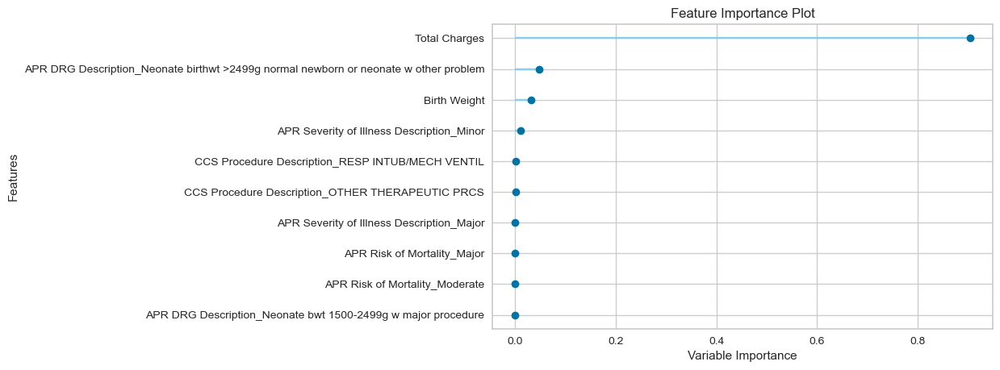

In [70]:
plot_model(exp1_dt,'feature',use_train_data=False)

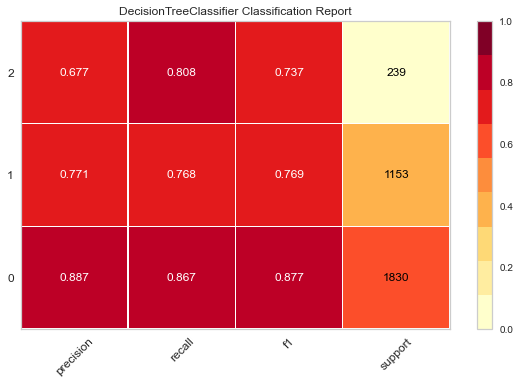

In [71]:
plot_model(exp1_dt,'class_report',use_train_data=False)

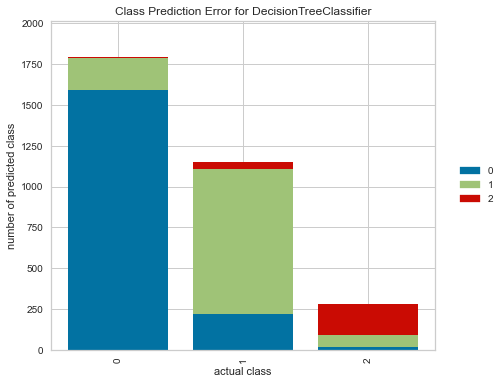

In [72]:
plot_model(exp1_dt,'error',use_train_data=False)

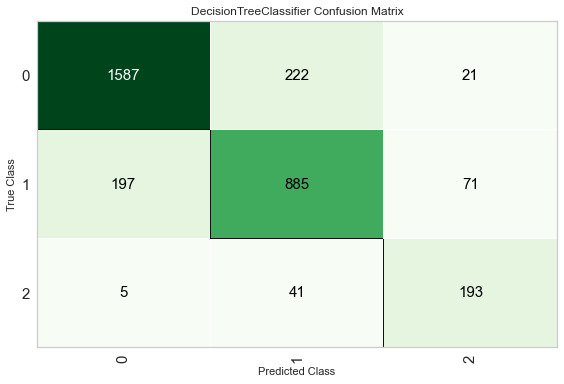

In [73]:
plot_model(exp1_dt,'confusion_matrix',use_train_data=False)

In [ ]:
# Charts

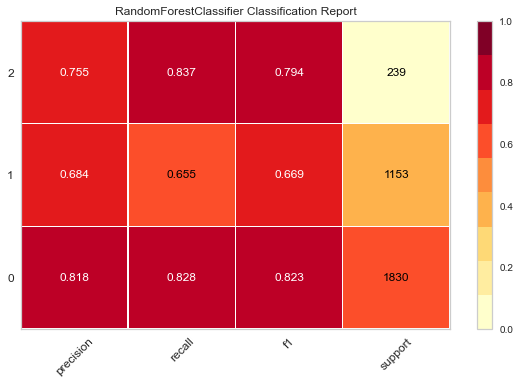

In [74]:
plot_model(exp1_rf,'class_report',use_train_data=False)

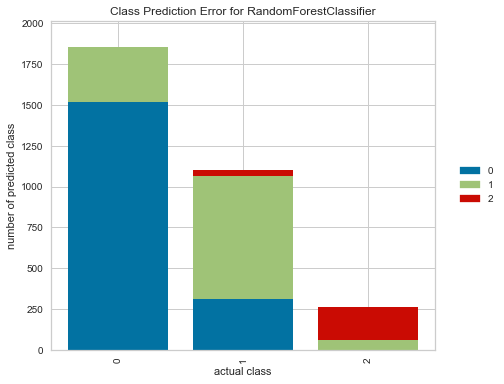

In [75]:
plot_model(exp1_rf,'error',use_train_data=False)

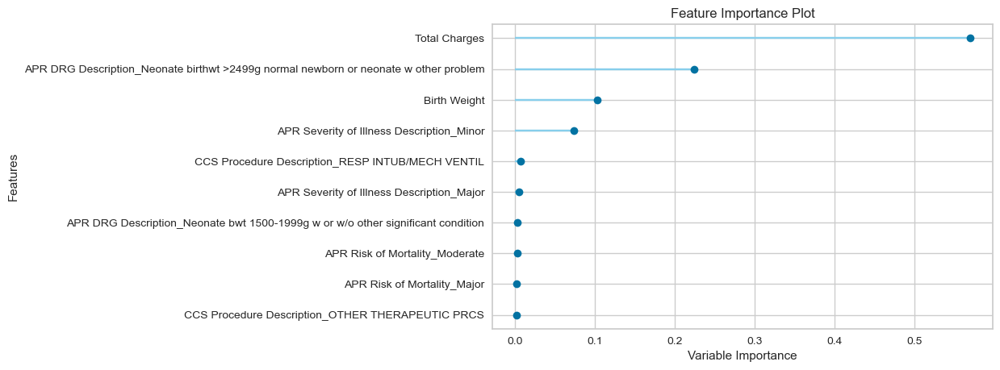

In [76]:
plot_model(exp1_rf,'feature',use_train_data=False)

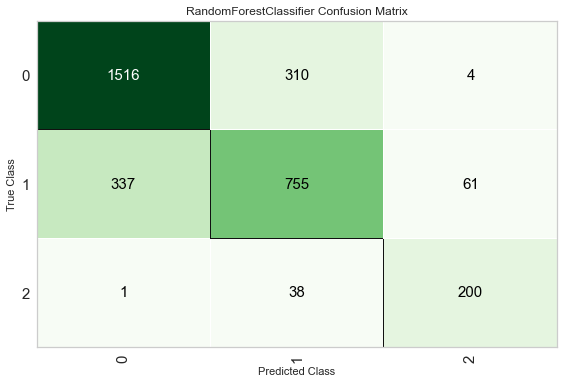

In [77]:
plot_model(exp1_rf,'confusion_matrix',use_train_data=False)

In [ ]:
# Charts KNN

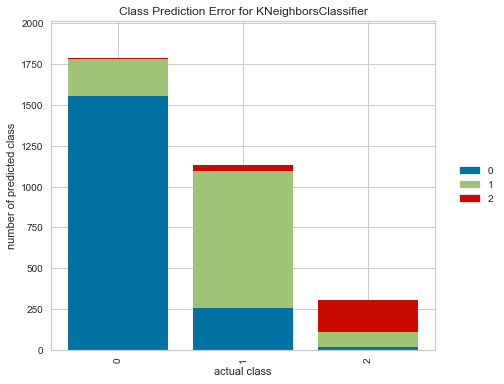

In [78]:
plot_model(exp1_knn,'error',use_train_data=False)

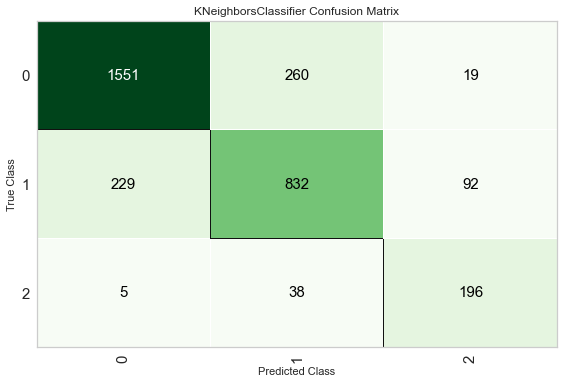

In [79]:
plot_model(exp1_knn,'confusion_matrix',use_train_data=False)

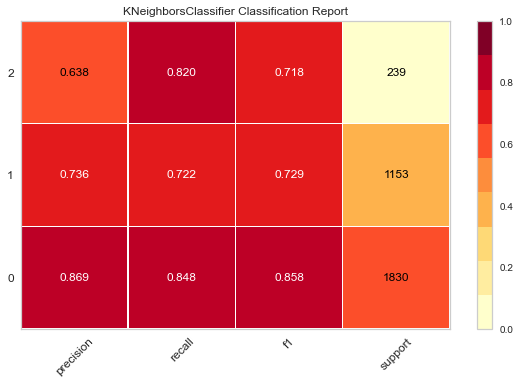

In [80]:
plot_model(exp1_knn,'class_report',use_train_data=False)

#  Experiment 2 -- classification with normalize and transformation as true

In [81]:
from pycaret.classification import *

In [84]:
#datanew=data.drop(columns=['LOS Class 2','Total Costs','Length of Stay'])
cls_features= setup(data[impcol], target='LOS Class 1',
            normalize=True,transformation=True,fix_imbalance=True,data_split_stratify=True,fold=5)

,Description,Value
0,session_id,3820
1,Target,LOS Class 1
2,Target Type,Multiclass
3,Label Encoded,None
4,Original Data,"(10737, 26)"
5,Missing Values,False
6,Numeric Features,25
7,Categorical Features,0
8,Ordinal Features,False
9,High Cardinality Features,False


In [85]:
exp2_dt=create_model('dt')
exp2_dt

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8011,0.8241,0.8158,0.8053,0.8022,0.6410,0.6418
1,0.7904,0.8155,0.8213,0.7972,0.7919,0.6245,0.6265
2,0.7711,0.8011,0.7868,0.7788,0.7732,0.5905,0.5920
3,0.7904,0.8145,0.7830,0.7936,0.7915,0.6200,0.6204
4,0.7898,0.8193,0.7982,0.8007,0.7925,0.6243,0.6278
Mean,0.7886,0.8149,0.8010,0.7951,0.7903,0.6201,0.6217
Std,0.0097,0.0077,0.0153,0.0090,0.0094,0.0164,0.0164


DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=3820, splitter='best')

In [86]:
exp2_rf=create_model('rf')
exp2_rf

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8077,0.8991,0.8201,0.8095,0.8083,0.6501,0.6504
1,0.8051,0.9017,0.8422,0.8103,0.8062,0.6494,0.6511
2,0.7871,0.8969,0.8070,0.7907,0.7880,0.6160,0.6166
3,0.7917,0.8917,0.7944,0.7915,0.7914,0.6190,0.6191
4,0.8051,0.9048,0.8103,0.8099,0.8066,0.6473,0.6484
Mean,0.7993,0.8988,0.8148,0.8024,0.8001,0.6363,0.6371
Std,0.0083,0.0045,0.0160,0.0092,0.0086,0.0155,0.0158


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=3820, verbose=0,
                       warm_start=False)

In [87]:
exp2_knn=create_model('knn')
exp2_knn

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7977,0.8773,0.8099,0.7989,0.7978,0.6320,0.6323
1,0.7924,0.8737,0.8226,0.7962,0.7933,0.6255,0.6264
2,0.7651,0.8585,0.7944,0.7714,0.7666,0.5797,0.5810
3,0.7778,0.8610,0.7921,0.7814,0.7788,0.5985,0.5991
4,0.7791,0.8645,0.7886,0.7860,0.7812,0.6024,0.6039
Mean,0.7824,0.8670,0.8015,0.7868,0.7835,0.6076,0.6085
Std,0.0115,0.0073,0.0128,0.0100,0.0111,0.0190,0.0187


KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
                     weights='uniform')

In [88]:
exp2_dt=tune_model(dt,fold=5)
exp2_dt

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8283,0.9192,0.8441,0.8366,0.8304,0.6925,0.6949
1,0.8077,0.9079,0.8512,0.8186,0.8097,0.6591,0.6622
2,0.8024,0.9075,0.8252,0.8069,0.7999,0.6412,0.6444
3,0.8104,0.9054,0.8136,0.8218,0.8135,0.6618,0.6648
4,0.8064,0.9118,0.8308,0.8129,0.8080,0.6531,0.6546
Mean,0.8110,0.9103,0.8330,0.8194,0.8123,0.6615,0.6642
Std,0.0090,0.0049,0.0134,0.0100,0.0101,0.0170,0.0169


DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=16, max_features=1.0, max_leaf_nodes=None,
                       min_impurity_decrease=0.001, min_impurity_split=None,
                       min_samples_leaf=2, min_samples_split=5,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=6980, splitter='best')

In [89]:
exp2_rf=tune_model(rf,fold=5)
exp2_rf

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7924,0.8799,0.8130,0.7963,0.7914,0.6246,0.6262
1,0.8004,0.8653,0.8346,0.8034,0.7996,0.6396,0.6407
2,0.7558,0.8663,0.7977,0.7637,0.7557,0.5653,0.5674
3,0.7957,0.8822,0.8229,0.8028,0.7962,0.6341,0.6357
4,0.7725,0.8789,0.8142,0.7936,0.7766,0.6018,0.6086
Mean,0.7834,0.8745,0.8165,0.7920,0.7839,0.6131,0.6157
Std,0.0168,0.0072,0.0122,0.0146,0.0161,0.0272,0.0265


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight={},
                       criterion='gini', max_depth=11, max_features=1.0,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.005, min_impurity_split=None,
                       min_samples_leaf=3, min_samples_split=10,
                       min_weight_fraction_leaf=0.0, n_estimators=250,
                       n_jobs=-1, oob_score=False, random_state=6980, verbose=0,
                       warm_start=False)

In [90]:
exp2_knn=tune_model(knn,fold=5)
exp2_knn


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7991,0.8917,0.8178,0.8026,0.7999,0.6371,0.6378
1,0.7917,0.8935,0.8301,0.7968,0.7927,0.6263,0.6276
2,0.7745,0.8818,0.8070,0.7800,0.7754,0.5962,0.5973
3,0.7924,0.8890,0.8122,0.7962,0.7932,0.6258,0.6264
4,0.7971,0.8976,0.8134,0.8028,0.7987,0.6349,0.6362
Mean,0.7910,0.8907,0.8161,0.7957,0.7920,0.6241,0.6250
Std,0.0087,0.0053,0.0078,0.0083,0.0088,0.0147,0.0146


KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=33, p=2,
                     weights='distance')

In [91]:
predict_model(exp2_dt)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Decision Tree Classifier,0.8237,0.9119,0.8228,0.8259,0.8239,0.6795,0.6800


,Birth Weight,Total Charges,Patient Disposition_Home w/ Home Health Services,CCS Procedure Description_ENTERAL/PARENTERAL NUTR,CCS Procedure Description_OTHER THERAPEUTIC PRCS,CCS Procedure Description_RESP INTUB/MECH VENTIL,APR DRG Description_Neonate birthwt 1500-1999g w major anomaly,APR DRG Description_Neonate birthwt 750-999g w/o major procedure,APR DRG Description_Neonate birthwt >2499g w congenital/perinatal infection,APR DRG Description_Neonate birthwt >2499g normal newborn or neonate w other problem,...,APR DRG Description_Neonate bwt <1500g w major procedure,APR DRG Description_Neonate birthwt >2499g w resp dist synd/oth maj resp cond,APR Severity of Illness Description_Major,APR Severity of Illness Description_Minor,APR Risk of Mortality_Major,APR Risk of Mortality_Moderate,APR Medical Surgical Description_Surgical,LOS Class 1,Label,Score
0,1.398347,0.512112,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,0,1,0.7526
1,-1.275872,0.234868,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,1,1,0.9786
2,-0.222078,-0.551355,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,0,0,0.5330
3,-0.389134,0.256656,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,1,1,0.9810
4,3.922633,-0.862665,1,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,1,1,0.8893
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3217,0.530954,0.158222,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,1,1,0.9579
3218,0.330559,1.026511,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,1,1,0.9502
3219,0.738376,-0.609330,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,1,0,0.5330
3220,-1.138505,-1.182256,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,0,0,0.9064


In [92]:
predict_model(exp2_rf)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Random Forest Classifier,0.7874,0.8869,0.8050,0.7962,0.7883,0.6194,0.6213


,Birth Weight,Total Charges,Patient Disposition_Home w/ Home Health Services,CCS Procedure Description_ENTERAL/PARENTERAL NUTR,CCS Procedure Description_OTHER THERAPEUTIC PRCS,CCS Procedure Description_RESP INTUB/MECH VENTIL,APR DRG Description_Neonate birthwt 1500-1999g w major anomaly,APR DRG Description_Neonate birthwt 750-999g w/o major procedure,APR DRG Description_Neonate birthwt >2499g w congenital/perinatal infection,APR DRG Description_Neonate birthwt >2499g normal newborn or neonate w other problem,...,APR DRG Description_Neonate bwt <1500g w major procedure,APR DRG Description_Neonate birthwt >2499g w resp dist synd/oth maj resp cond,APR Severity of Illness Description_Major,APR Severity of Illness Description_Minor,APR Risk of Mortality_Major,APR Risk of Mortality_Moderate,APR Medical Surgical Description_Surgical,LOS Class 1,Label,Score
0,1.398347,0.512112,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,0,1,0.7545
1,-1.275872,0.234868,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,1,1,0.7572
2,-0.222078,-0.551355,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,0,0,0.5227
3,-0.389134,0.256656,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,1,1,0.7572
4,3.922633,-0.862665,1,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,1,1,0.8737
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3217,0.530954,0.158222,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,1,1,0.7572
3218,0.330559,1.026511,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,1,1,0.7545
3219,0.738376,-0.609330,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,1,0,0.5227
3220,-1.138505,-1.182256,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,0,0,0.8505


In [93]:
predict_model(exp2_knn)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,K Neighbors Classifier,0.7917,0.8989,0.8046,0.7987,0.7937,0.6263,0.6277


,Birth Weight,Total Charges,Patient Disposition_Home w/ Home Health Services,CCS Procedure Description_ENTERAL/PARENTERAL NUTR,CCS Procedure Description_OTHER THERAPEUTIC PRCS,CCS Procedure Description_RESP INTUB/MECH VENTIL,APR DRG Description_Neonate birthwt 1500-1999g w major anomaly,APR DRG Description_Neonate birthwt 750-999g w/o major procedure,APR DRG Description_Neonate birthwt >2499g w congenital/perinatal infection,APR DRG Description_Neonate birthwt >2499g normal newborn or neonate w other problem,...,APR DRG Description_Neonate bwt <1500g w major procedure,APR DRG Description_Neonate birthwt >2499g w resp dist synd/oth maj resp cond,APR Severity of Illness Description_Major,APR Severity of Illness Description_Minor,APR Risk of Mortality_Major,APR Risk of Mortality_Moderate,APR Medical Surgical Description_Surgical,LOS Class 1,Label,Score
0,1.398347,0.512112,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,0,0,0.6819
1,-1.275872,0.234868,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,1,1,0.6847
2,-0.222078,-0.551355,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,0,1,0.7134
3,-0.389134,0.256656,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,1,1,0.9950
4,3.922633,-0.862665,1,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,1,1,0.6179
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3217,0.530954,0.158222,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,1,1,0.7689
3218,0.330559,1.026511,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,1,1,0.9577
3219,0.738376,-0.609330,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,1,1,0.5942
3220,-1.138505,-1.182256,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,0,0,0,0.9047


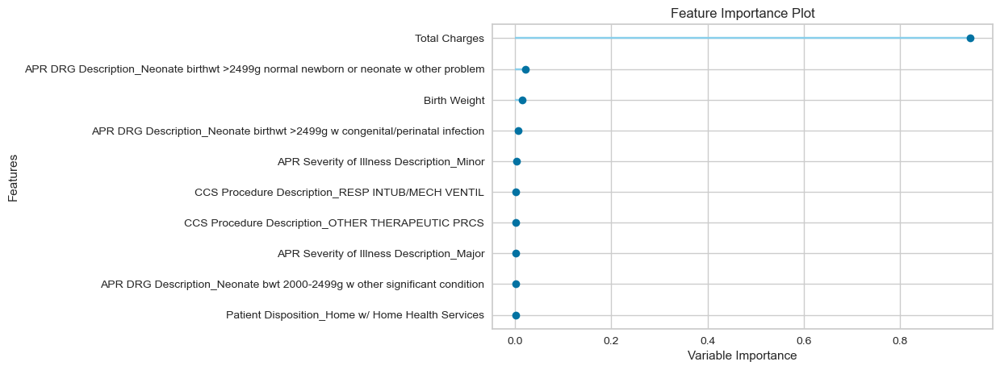

In [94]:
plot_model(exp2_dt,'feature',use_train_data=False)

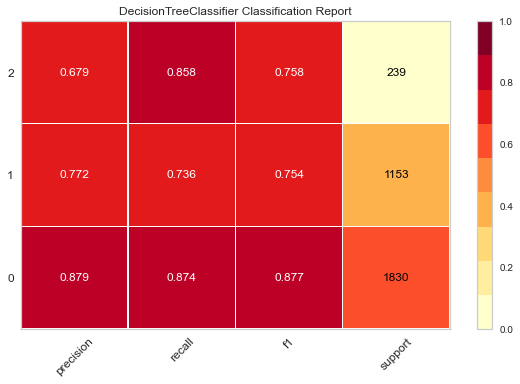

In [95]:
plot_model(exp2_dt,'class_report',use_train_data=False)

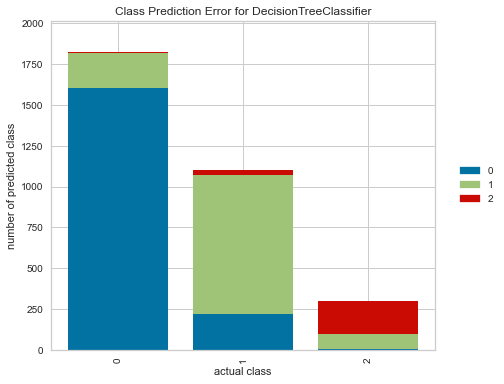

In [96]:
plot_model(exp2_dt,'error',use_train_data=False)

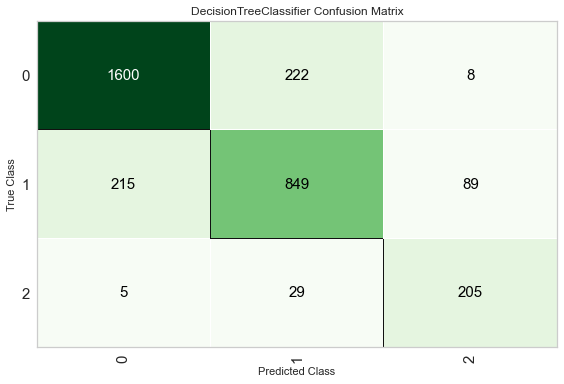

In [97]:
plot_model(exp2_dt,'confusion_matrix',use_train_data=False)

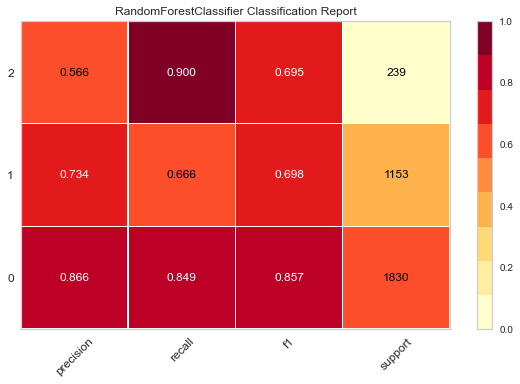

In [98]:
plot_model(exp2_rf,'class_report',use_train_data=False)

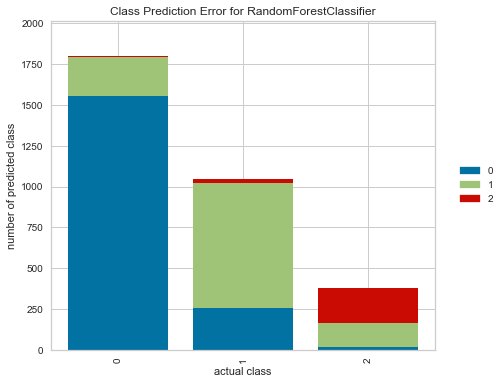

In [99]:
plot_model(exp2_rf,'error',use_train_data=False)

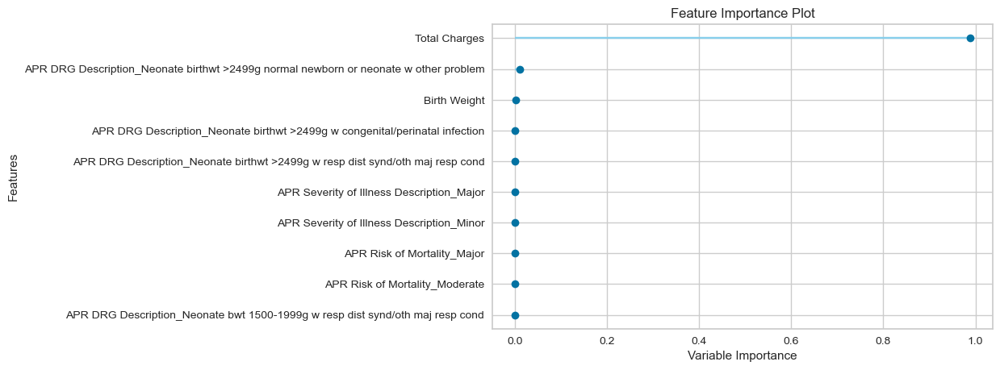

In [100]:
plot_model(exp2_rf,'feature',use_train_data=False)

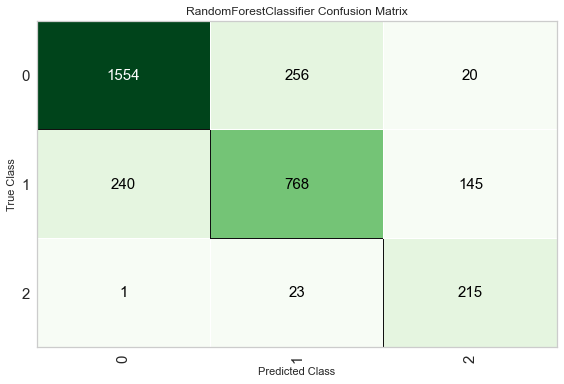

In [101]:
plot_model(exp2_rf,'confusion_matrix',use_train_data=False)

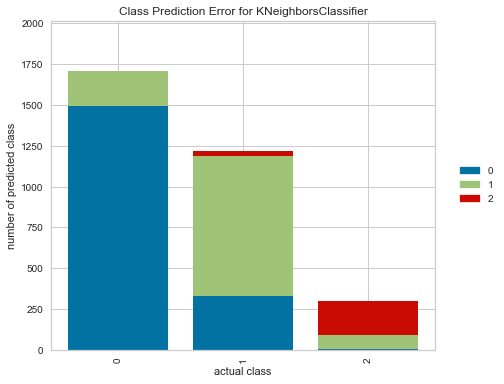

In [102]:
plot_model(exp2_knn,'error',use_train_data=False)

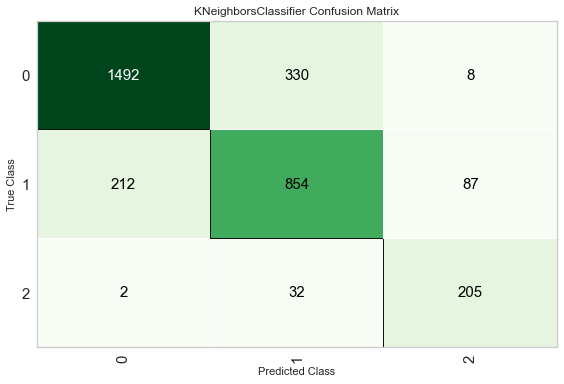

In [103]:
plot_model(exp2_knn,'confusion_matrix',use_train_data=False)

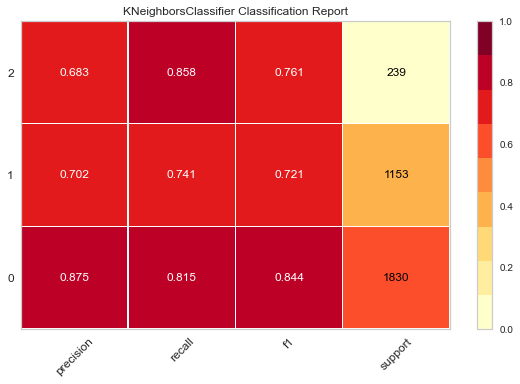

In [104]:
plot_model(exp2_knn,'class_report',use_train_data=False)

# Exp 3 , classic feature , normalize transform 5 fold

In [105]:
from pycaret.classification import *

In [106]:
datanew=data.drop(columns=['LOS Class 2','Total Costs','Length of Stay'])
cls_features= setup(datanew, target='LOS Class 1',
            normalize=True,transformation=True,fix_imbalance=True,data_split_stratify=True,feature_selection=True,fold=5)

,Description,Value
0,session_id,7353
1,Target,LOS Class 1
2,Target Type,Multiclass
3,Label Encoded,None
4,Original Data,"(10737, 297)"
5,Missing Values,False
6,Numeric Features,296
7,Categorical Features,0
8,Ordinal Features,False
9,High Cardinality Features,False


In [107]:
exp3_dt=create_model('dt')
exp3_dt


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9122,0.9276,0.8775,0.9141,0.9128,0.8398,0.8403
1,0.9135,0.9317,0.9037,0.9179,0.9149,0.8437,0.8446
2,0.9215,0.9374,0.8955,0.9240,0.9224,0.8572,0.8575
3,0.9335,0.9445,0.9177,0.9344,0.9338,0.8783,0.8784
4,0.9128,0.9275,0.8912,0.9148,0.9135,0.8409,0.8411
Mean,0.9187,0.9338,0.8971,0.9210,0.9195,0.8520,0.8524
Std,0.0081,0.0065,0.0133,0.0076,0.0079,0.0146,0.0144


DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=7353, splitter='best')

In [108]:
exp3_rf=create_model('rf')
exp3_rf

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8696,0.9524,0.8480,0.8700,0.8697,0.7600,0.7601
1,0.8869,0.9564,0.8810,0.8915,0.8881,0.7953,0.7970
2,0.8796,0.9581,0.8550,0.8817,0.8803,0.7804,0.7809
3,0.8782,0.9573,0.8623,0.8792,0.8786,0.7769,0.7771
4,0.8929,0.9602,0.8803,0.8931,0.8930,0.8033,0.8033
Mean,0.8814,0.9569,0.8653,0.8831,0.8820,0.7832,0.7837
Std,0.0079,0.0026,0.0133,0.0085,0.0080,0.0151,0.0153


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=7353, verbose=0,
                       warm_start=False)

In [109]:
exp3_knn=create_model('knn')
exp3_knn

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7126,0.8029,0.7456,0.7127,0.7122,0.4775,0.4777
1,0.7112,0.8059,0.7509,0.7156,0.7123,0.4803,0.4811
2,0.7206,0.8082,0.7475,0.7242,0.7218,0.4943,0.4949
3,0.7172,0.8026,0.7669,0.7199,0.7176,0.4900,0.4907
4,0.7265,0.8177,0.7617,0.7278,0.7265,0.5044,0.5047
Mean,0.7176,0.8075,0.7545,0.7200,0.7181,0.4893,0.4898
Std,0.0056,0.0055,0.0083,0.0055,0.0055,0.0097,0.0097


KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
                     weights='uniform')

In [110]:
exp3_dt=tune_model(dt,fold=5)
exp3_dt

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9122,0.9623,0.8921,0.9153,0.9132,0.8406,0.8412
1,0.9208,0.9623,0.9081,0.9243,0.9218,0.8566,0.8577
2,0.9208,0.9628,0.8894,0.9227,0.9214,0.8557,0.8563
3,0.9248,0.9633,0.9100,0.9281,0.9259,0.8635,0.8640
4,0.9195,0.9649,0.9050,0.9226,0.9205,0.8539,0.8546
Mean,0.9196,0.9631,0.9009,0.9226,0.9206,0.8541,0.8548
Std,0.0041,0.0010,0.0085,0.0042,0.0041,0.0075,0.0075


DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=15, max_features=1.0, max_leaf_nodes=None,
                       min_impurity_decrease=0, min_impurity_split=None,
                       min_samples_leaf=5, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=6980, splitter='best')

In [111]:
exp3_rf=tune_model(rf,fold=5)
exp3_rf

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9215,0.9683,0.9144,0.9242,0.9223,0.8576,0.8582
1,0.8975,0.9602,0.8889,0.9023,0.8990,0.8150,0.8159
2,0.9202,0.9638,0.8995,0.9238,0.9212,0.8553,0.8565
3,0.9188,0.9722,0.9139,0.9234,0.9202,0.8533,0.8542
4,0.9188,0.9618,0.9086,0.9236,0.9202,0.8534,0.8548
Mean,0.9154,0.9652,0.9051,0.9194,0.9166,0.8469,0.8479
Std,0.0090,0.0044,0.0097,0.0086,0.0088,0.0160,0.0161


RandomForestClassifier(bootstrap=False, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='gini',
                       max_depth=8, max_features=1.0, max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.0002,
                       min_impurity_split=None, min_samples_leaf=4,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=130, n_jobs=-1, oob_score=False,
                       random_state=6980, verbose=0, warm_start=False)

In [112]:
exp3_knn=tune_model(knn,fold=5)
exp3_knn

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7711,0.8691,0.7918,0.7729,0.7710,0.5857,0.5862
1,0.7718,0.8721,0.7978,0.7755,0.7720,0.5893,0.5900
2,0.7718,0.8796,0.7860,0.7727,0.7713,0.5858,0.5862
3,0.7818,0.8773,0.8135,0.7843,0.7819,0.6060,0.6066
4,0.7738,0.8812,0.7934,0.7761,0.7737,0.5907,0.5912
Mean,0.7741,0.8759,0.7965,0.7763,0.7740,0.5915,0.5920
Std,0.0040,0.0046,0.0093,0.0042,0.0040,0.0075,0.0075


KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan',
                     metric_params=None, n_jobs=-1, n_neighbors=21, p=2,
                     weights='distance')

In [113]:
predict_model(exp3_dt)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Decision Tree Classifier,0.9174,0.9631,0.9039,0.9222,0.9190,0.8506,0.8512


,CCS Diagnosis Description_Other congenital anomalies,Payment Typology 1_Medicaid,Facility Name_New York-Presbyterian/Lower Manhattan Hospital,CCS Procedure Description_OT OR THER PRCS ON BONE,Facility Name_Woodhull Medical & Mental Health Center,CCS Procedure Description_EXTRA CIRC AUX OPEN HRT,CCS Procedure Description_ELECTROENCEPHALOGRAM,Facility Name_Brookdale Hospital Medical Center,CCS Procedure Description_INS CATHETER/SPNL STIM,APR DRG Description_Neonate bwt 1250-1499g w or w/o other significant condition,...,CCS Procedure Description_OT OR THER PRC SKN/BRST,CCS Procedure Description_OT OR PRCS VES NOT HEAD,CCS Procedure Description_PROCTOSCOPY & AR BIOPSY,APR DRG Description_Neonate birthwt 500-749g w/o major procedure,CCS Procedure Description_OT THER PRCS; HEM/LYMPH,CCS Procedure Description_OT DX CARDIOVASC PRCS,Patient Disposition_Critical Access Hospital,LOS Class 1,Label,Score
0,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,2,2,1.0000
1,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,1.0000
2,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1.0000
3,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1.0000
4,0,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1.0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3217,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,2,0.5615
3218,0,1,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,2,2,1.0000
3219,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1.0000
3220,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0.7750


In [114]:
predict_model(exp3_rf)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Random Forest Classifier,0.9174,0.9649,0.9014,0.9210,0.9185,0.8504,0.8515


,CCS Diagnosis Description_Other congenital anomalies,Payment Typology 1_Medicaid,Facility Name_New York-Presbyterian/Lower Manhattan Hospital,CCS Procedure Description_OT OR THER PRCS ON BONE,Facility Name_Woodhull Medical & Mental Health Center,CCS Procedure Description_EXTRA CIRC AUX OPEN HRT,CCS Procedure Description_ELECTROENCEPHALOGRAM,Facility Name_Brookdale Hospital Medical Center,CCS Procedure Description_INS CATHETER/SPNL STIM,APR DRG Description_Neonate bwt 1250-1499g w or w/o other significant condition,...,CCS Procedure Description_OT OR THER PRC SKN/BRST,CCS Procedure Description_OT OR PRCS VES NOT HEAD,CCS Procedure Description_PROCTOSCOPY & AR BIOPSY,APR DRG Description_Neonate birthwt 500-749g w/o major procedure,CCS Procedure Description_OT THER PRCS; HEM/LYMPH,CCS Procedure Description_OT DX CARDIOVASC PRCS,Patient Disposition_Critical Access Hospital,LOS Class 1,Label,Score
0,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,2,2,0.9933
1,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0.9892
2,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.9921
3,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.9921
4,0,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.9921
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3217,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,1,0.9437
3218,0,1,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,2,2,0.9933
3219,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.9921
3220,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0.9437


In [115]:
predict_model(exp3_knn)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,K Neighbors Classifier,0.7827,0.8852,0.7968,0.7848,0.7826,0.6064,0.6069


,CCS Diagnosis Description_Other congenital anomalies,Payment Typology 1_Medicaid,Facility Name_New York-Presbyterian/Lower Manhattan Hospital,CCS Procedure Description_OT OR THER PRCS ON BONE,Facility Name_Woodhull Medical & Mental Health Center,CCS Procedure Description_EXTRA CIRC AUX OPEN HRT,CCS Procedure Description_ELECTROENCEPHALOGRAM,Facility Name_Brookdale Hospital Medical Center,CCS Procedure Description_INS CATHETER/SPNL STIM,APR DRG Description_Neonate bwt 1250-1499g w or w/o other significant condition,...,CCS Procedure Description_OT OR THER PRC SKN/BRST,CCS Procedure Description_OT OR PRCS VES NOT HEAD,CCS Procedure Description_PROCTOSCOPY & AR BIOPSY,APR DRG Description_Neonate birthwt 500-749g w/o major procedure,CCS Procedure Description_OT THER PRCS; HEM/LYMPH,CCS Procedure Description_OT DX CARDIOVASC PRCS,Patient Disposition_Critical Access Hospital,LOS Class 1,Label,Score
0,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,2,2,1.0000
1,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0.5850
2,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.7197
3,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.8990
4,0,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.8808
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3217,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,2,0.5259
3218,0,1,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,2,2,1.0000
3219,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.8418
3220,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0.6248


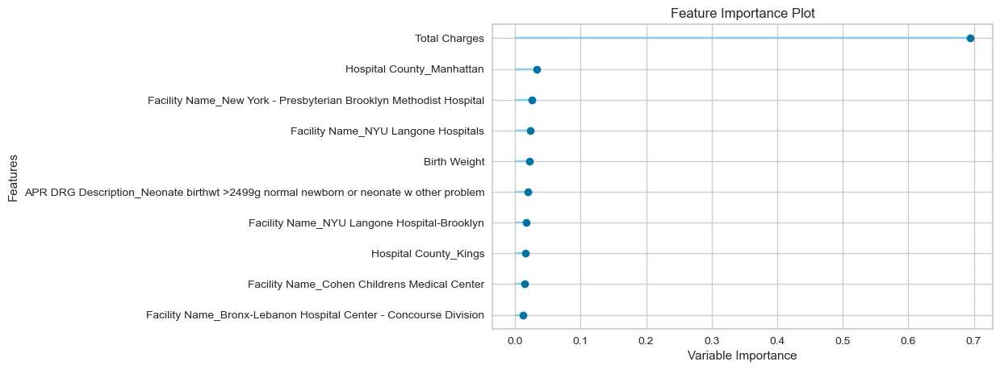

In [116]:
plot_model(exp3_dt,'feature',use_train_data=False)

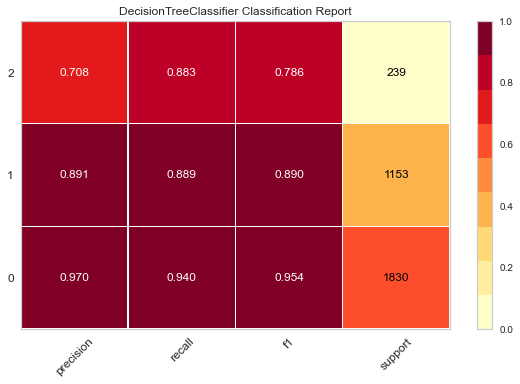

In [117]:
plot_model(exp3_dt,'class_report',use_train_data=False)

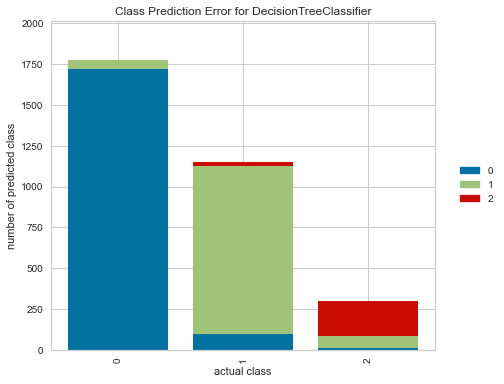

In [118]:
plot_model(exp3_dt,'error',use_train_data=False)

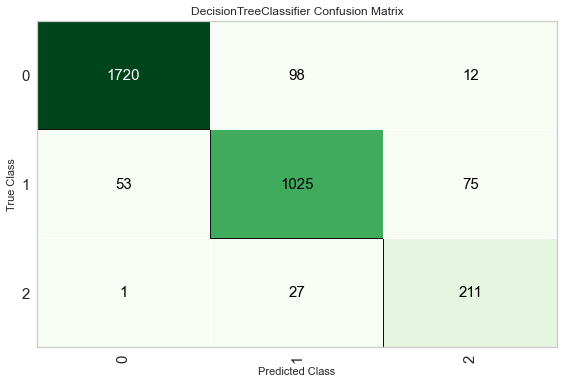

In [119]:
plot_model(exp3_dt,'confusion_matrix',use_train_data=False)

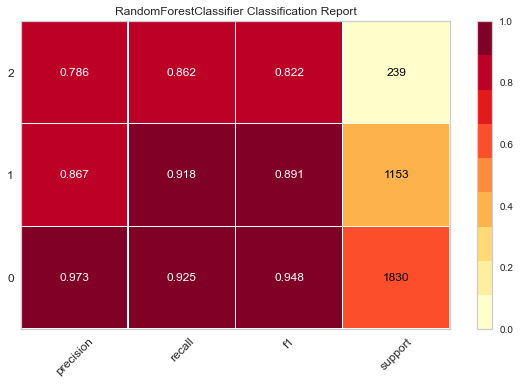

In [120]:
plot_model(exp3_rf,'class_report',use_train_data=False)

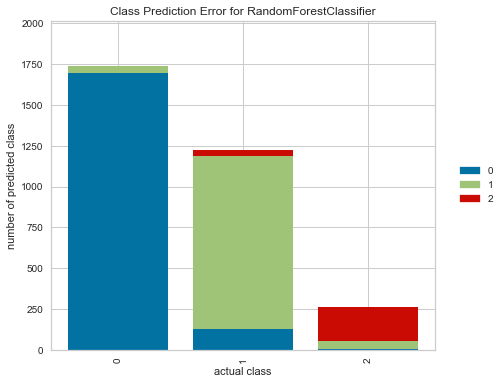

In [121]:
plot_model(exp3_rf,'error',use_train_data=False)

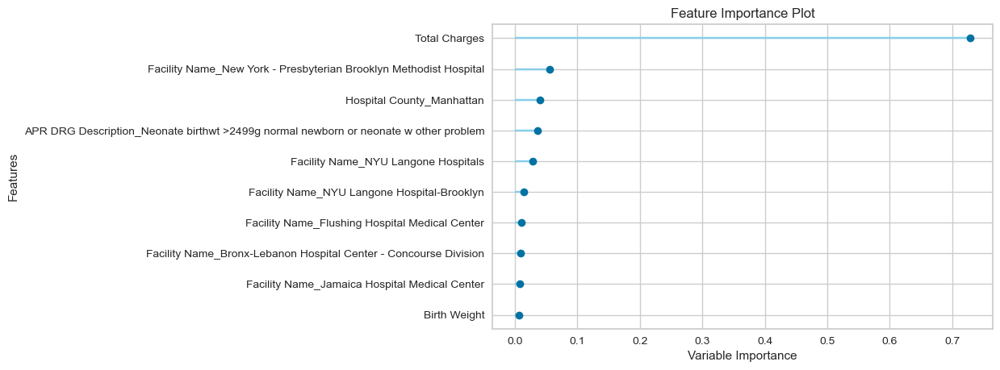

In [122]:
plot_model(exp3_rf,'feature',use_train_data=False)

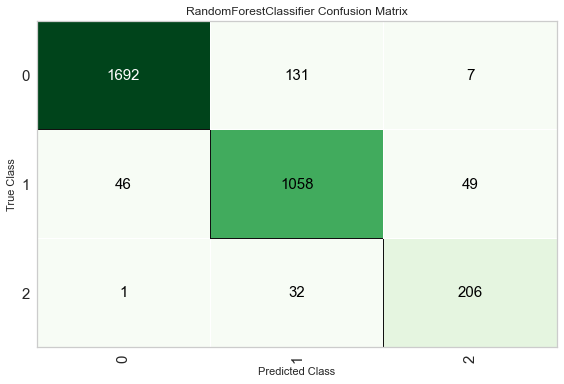

In [123]:
plot_model(exp3_rf,'confusion_matrix',use_train_data=False)

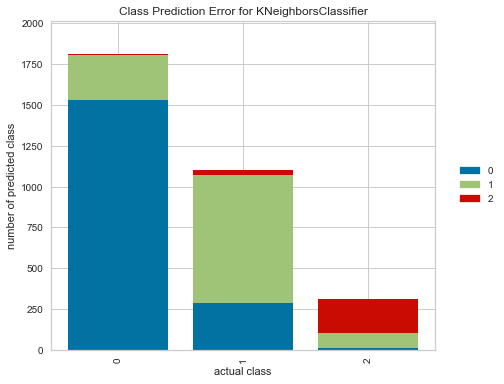

In [124]:
plot_model(exp3_knn,'error',use_train_data=False)

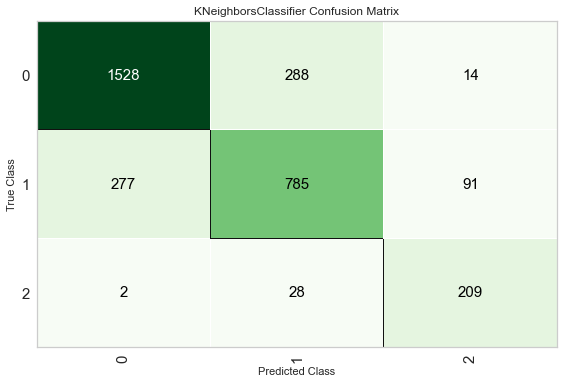

In [125]:
plot_model(exp3_knn,'confusion_matrix',use_train_data=False)

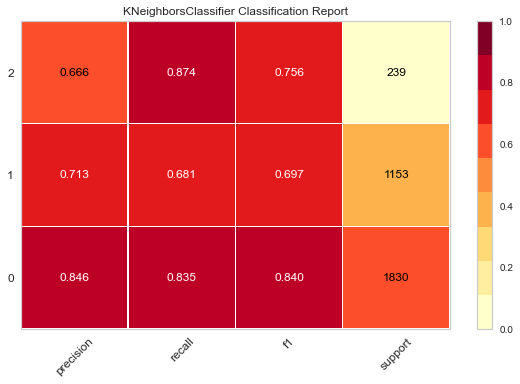

In [126]:
plot_model(exp3_knn,'class_report',use_train_data=False)

## Experiment 4: Features selected as per Corr , Birthweight

In [ ]:
# Selecting features as per threshold of -+0.5 based on correlation table

* Length of Stay is +vely correlated with Total Costs, total Charges.
* LOS is negatively correlated with 
*  APR Risk of Mortality_Minor ,
* Birth Weight ,
*  APR DRG Description_Neonate birthwt >2499g, normal newborn or neonate w other problem


In [127]:
from pycaret.classification import *

In [128]:
datanew=data[['Birth Weight','LOS Class 1','Total Charges']]
datanew.shape

(10737, 3)

In [129]:
datanew=datanew.drop_duplicates()
datanew.shape

(10013, 3)

In [130]:
cls_features=setup(datanew,target='LOS Class 1',normalize=True,transformation=True,fix_imbalance=True,
                   data_split_stratify=True,fold=5)

,Description,Value
0,session_id,6906
1,Target,LOS Class 1
2,Target Type,Multiclass
3,Label Encoded,None
4,Original Data,"(10013, 3)"
5,Missing Values,False
6,Numeric Features,2
7,Categorical Features,0
8,Ordinal Features,False
9,High Cardinality Features,False


In [131]:
exp4_dt=create_model('dt')
exp4_dt

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7382,0.7764,0.7334,0.7480,0.7414,0.5390,0.5406
1,0.7425,0.7753,0.7466,0.7482,0.7443,0.5444,0.5453
2,0.7553,0.7895,0.7843,0.7623,0.7567,0.5706,0.5719
3,0.7582,0.7890,0.7704,0.7623,0.7591,0.5720,0.5726
4,0.7802,0.8100,0.7806,0.7844,0.7812,0.6099,0.6104
Mean,0.7549,0.7880,0.7631,0.7610,0.7565,0.5672,0.5681
Std,0.0147,0.0125,0.0198,0.0133,0.0141,0.0252,0.0249


DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=6906, splitter='best')

In [132]:
exp4_rf=create_model('rf')
exp4_rf

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7439,0.8649,0.7380,0.7440,0.7437,0.5399,0.5400
1,0.7753,0.8815,0.7794,0.7776,0.7761,0.5993,0.5996
2,0.7653,0.8843,0.7755,0.7661,0.7655,0.5800,0.5801
3,0.7625,0.8828,0.7748,0.7656,0.7634,0.5780,0.5785
4,0.7759,0.8893,0.7757,0.7774,0.7764,0.5990,0.5992
Mean,0.7646,0.8805,0.7687,0.7661,0.7650,0.5793,0.5795
Std,0.0116,0.0083,0.0154,0.0122,0.0119,0.0216,0.0217


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=6906, verbose=0,
                       warm_start=False)

In [133]:
exp4_knn=create_model('knn')
exp4_knn

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7632,0.8479,0.7576,0.7630,0.7630,0.5739,0.5739
1,0.7782,0.8568,0.7917,0.7821,0.7792,0.6068,0.6074
2,0.7817,0.8617,0.8028,0.7837,0.7819,0.6121,0.6125
3,0.7782,0.8607,0.7965,0.7815,0.7785,0.6071,0.6077
4,0.7737,0.8690,0.7836,0.7783,0.7751,0.5988,0.5995
Mean,0.7750,0.8592,0.7864,0.7777,0.7755,0.5997,0.6002
Std,0.0064,0.0069,0.0157,0.0076,0.0066,0.0136,0.0138


KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
                     weights='uniform')

In [134]:
exp4_dt=tune_model(dt,fold=5)
exp4_dt

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8003,0.9000,0.8139,0.8063,0.8016,0.6474,0.6483
1,0.7960,0.8966,0.8202,0.8064,0.7980,0.6433,0.6452
2,0.8138,0.9067,0.8348,0.8177,0.8140,0.6703,0.6712
3,0.7932,0.8994,0.8148,0.8026,0.7949,0.6376,0.6393
4,0.8059,0.9068,0.8136,0.8164,0.8075,0.6582,0.6605
Mean,0.8018,0.9019,0.8195,0.8099,0.8032,0.6514,0.6529
Std,0.0074,0.0041,0.0080,0.0060,0.0068,0.0116,0.0115


DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=13, max_features=1.0, max_leaf_nodes=None,
                       min_impurity_decrease=0.001, min_impurity_split=None,
                       min_samples_leaf=6, min_samples_split=5,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=6980, splitter='best')

In [135]:
exp4_rf=tune_model(rf,fold=5)
exp4_rf

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8003,0.9007,0.8139,0.8063,0.8016,0.6474,0.6483
1,0.7960,0.8965,0.8202,0.8064,0.7980,0.6433,0.6452
2,0.8131,0.9056,0.8362,0.8185,0.8140,0.6705,0.6715
3,0.7939,0.8977,0.8178,0.8031,0.7955,0.6389,0.6406
4,0.8059,0.9081,0.8160,0.8161,0.8073,0.6581,0.6604
Mean,0.8018,0.9017,0.8208,0.8101,0.8033,0.6516,0.6532
Std,0.0070,0.0045,0.0080,0.0061,0.0067,0.0114,0.0112


RandomForestClassifier(bootstrap=False, ccp_alpha=0.0, class_weight={},
                       criterion='entropy', max_depth=8, max_features=1.0,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.001, min_impurity_split=None,
                       min_samples_leaf=3, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=260,
                       n_jobs=-1, oob_score=False, random_state=6980, verbose=0,
                       warm_start=False)

In [136]:
exp4_knn=tune_model(knn,fold=5)
exp4_knn

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7725,0.8573,0.7629,0.7735,0.7728,0.5918,0.5919
1,0.7760,0.8677,0.7959,0.7825,0.7777,0.6055,0.6067
2,0.7853,0.8735,0.8122,0.7873,0.7852,0.6190,0.6195
3,0.7775,0.8660,0.7967,0.7834,0.7786,0.6080,0.6090
4,0.7787,0.8800,0.7945,0.7844,0.7802,0.6091,0.6101
Mean,0.7780,0.8689,0.7924,0.7822,0.7789,0.6067,0.6075
Std,0.0042,0.0076,0.0161,0.0046,0.0040,0.0087,0.0089


KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=7, p=2,
                     weights='uniform')

In [137]:
predict_model(exp4_dt,data=data_unseen)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Decision Tree Classifier,0.8150,0.9141,0.8321,0.8226,0.8159,0.6667,0.6683


,Length of Stay,Birth Weight,Total Charges,Total Costs,Hospital County_Kings,Hospital County_Manhattan,Hospital County_Queens,Hospital County_Richmond,Facility Name_Bronx-Lebanon Hospital Center - Concourse Division,Facility Name_Brookdale Hospital Medical Center,...,Payment Typology 1_Medicare,Payment Typology 1_Miscellaneous/Other,Payment Typology 1_Private Health Insurance,Payment Typology 1_Self-Pay,Payment Typology 1_Unknown,Emergency Department Indicator_Y,LOS Class 1,LOS Class 2,Label,Score
0,4,2400,16435.00,1720.74,0,1,0,0,0,0,...,0,0,0,0,0,0,1,1,1,0.5429
1,4,2100,23201.15,2553.12,0,1,0,0,0,0,...,0,0,0,0,0,0,1,1,2,0.5141
2,1,3400,4205.00,438.67,0,1,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0.5128
3,20,2200,213770.86,89779.95,0,1,0,0,0,0,...,0,0,0,0,0,0,2,1,2,0.9996
4,9,1800,95689.76,40145.55,0,1,0,0,0,0,...,0,0,1,0,0,0,2,1,2,1.0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96624,2,2800,9959.72,1510.93,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0.9367
96625,13,1600,192543.12,32271.66,0,0,1,0,0,0,...,0,0,1,0,0,0,2,1,2,0.9996
96626,2,3100,11000.36,1643.23,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0.7730
96627,2,2400,10594.70,1930.85,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0.8430


In [138]:
predict_model(exp4_rf,data=data_unseen)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Random Forest Classifier,0.8150,0.9141,0.8321,0.8226,0.8159,0.6667,0.6683


,Length of Stay,Birth Weight,Total Charges,Total Costs,Hospital County_Kings,Hospital County_Manhattan,Hospital County_Queens,Hospital County_Richmond,Facility Name_Bronx-Lebanon Hospital Center - Concourse Division,Facility Name_Brookdale Hospital Medical Center,...,Payment Typology 1_Medicare,Payment Typology 1_Miscellaneous/Other,Payment Typology 1_Private Health Insurance,Payment Typology 1_Self-Pay,Payment Typology 1_Unknown,Emergency Department Indicator_Y,LOS Class 1,LOS Class 2,Label,Score
0,4,2400,16435.00,1720.74,0,1,0,0,0,0,...,0,0,0,0,0,0,1,1,1,0.5429
1,4,2100,23201.15,2553.12,0,1,0,0,0,0,...,0,0,0,0,0,0,1,1,2,0.5141
2,1,3400,4205.00,438.67,0,1,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0.5128
3,20,2200,213770.86,89779.95,0,1,0,0,0,0,...,0,0,0,0,0,0,2,1,2,0.9996
4,9,1800,95689.76,40145.55,0,1,0,0,0,0,...,0,0,1,0,0,0,2,1,2,1.0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96624,2,2800,9959.72,1510.93,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0.9367
96625,13,1600,192543.12,32271.66,0,0,1,0,0,0,...,0,0,1,0,0,0,2,1,2,0.9996
96626,2,3100,11000.36,1643.23,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0.7730
96627,2,2400,10594.70,1930.85,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0.8430


In [139]:
predict_model(exp4_knn,data=data_unseen)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,K Neighbors Classifier,0.7921,0.8814,0.8046,0.7962,0.7932,0.6235,0.6242


,Length of Stay,Birth Weight,Total Charges,Total Costs,Hospital County_Kings,Hospital County_Manhattan,Hospital County_Queens,Hospital County_Richmond,Facility Name_Bronx-Lebanon Hospital Center - Concourse Division,Facility Name_Brookdale Hospital Medical Center,...,Payment Typology 1_Medicare,Payment Typology 1_Miscellaneous/Other,Payment Typology 1_Private Health Insurance,Payment Typology 1_Self-Pay,Payment Typology 1_Unknown,Emergency Department Indicator_Y,LOS Class 1,LOS Class 2,Label,Score
0,4,2400,16435.00,1720.74,0,1,0,0,0,0,...,0,0,0,0,0,0,1,1,1,1.0000
1,4,2100,23201.15,2553.12,0,1,0,0,0,0,...,0,0,0,0,0,0,1,1,2,0.7143
2,1,3400,4205.00,438.67,0,1,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0.5714
3,20,2200,213770.86,89779.95,0,1,0,0,0,0,...,0,0,0,0,0,0,2,1,2,1.0000
4,9,1800,95689.76,40145.55,0,1,0,0,0,0,...,0,0,1,0,0,0,2,1,2,1.0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96624,2,2800,9959.72,1510.93,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0.8571
96625,13,1600,192543.12,32271.66,0,0,1,0,0,0,...,0,0,1,0,0,0,2,1,2,1.0000
96626,2,3100,11000.36,1643.23,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0.8571
96627,2,2400,10594.70,1930.85,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,1.0000


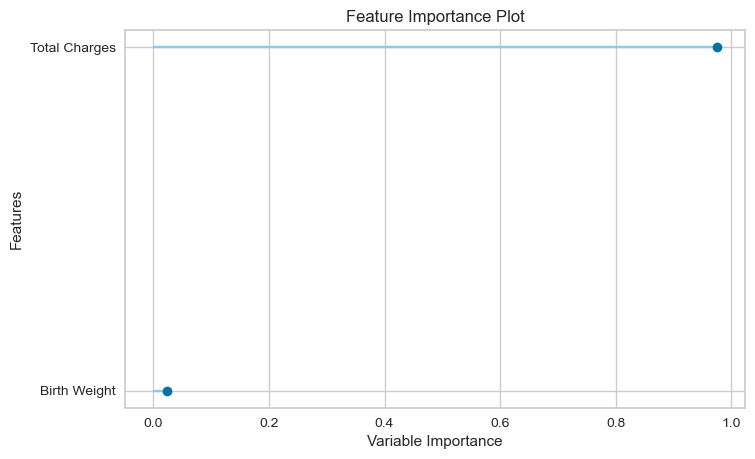

In [140]:
plot_model(exp4_dt,'feature',use_train_data=False)

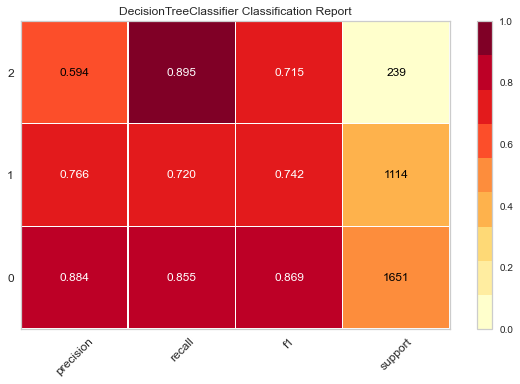

In [141]:
plot_model(exp4_dt,'class_report',use_train_data=False)

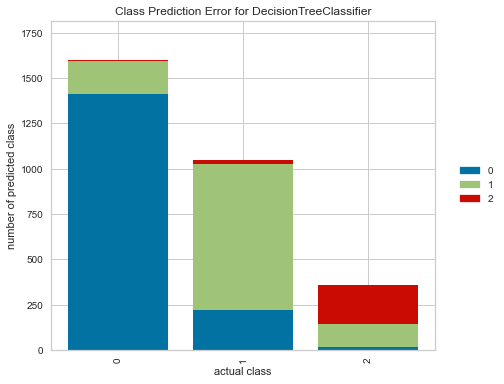

In [142]:
plot_model(exp4_dt,'error',use_train_data=False)

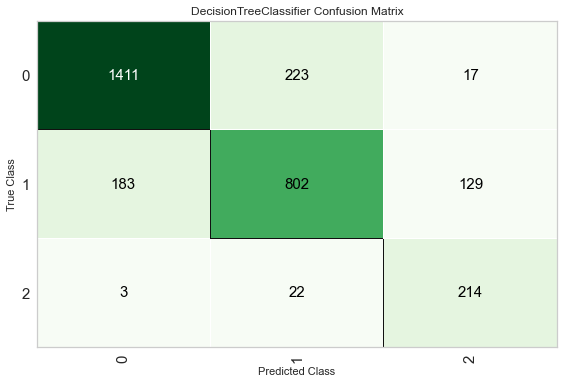

In [143]:
plot_model(exp4_dt,'confusion_matrix',use_train_data=False)

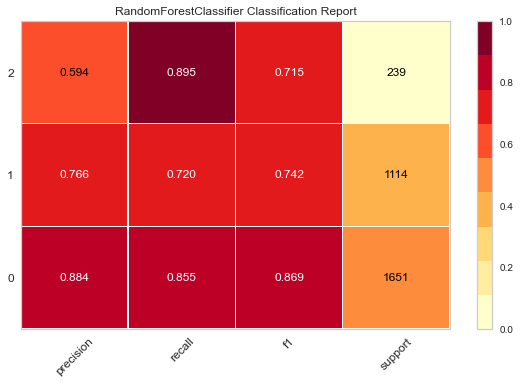

In [144]:
plot_model(exp4_rf,'class_report',use_train_data=False)

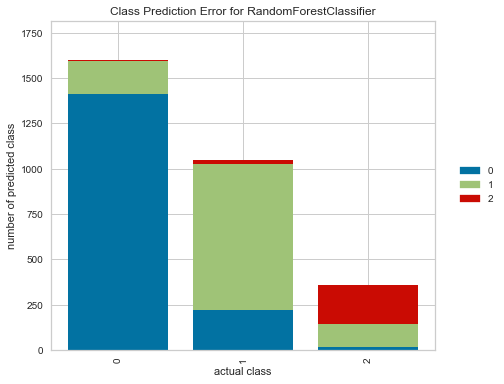

In [145]:
plot_model(exp4_rf,'error',use_train_data=False)

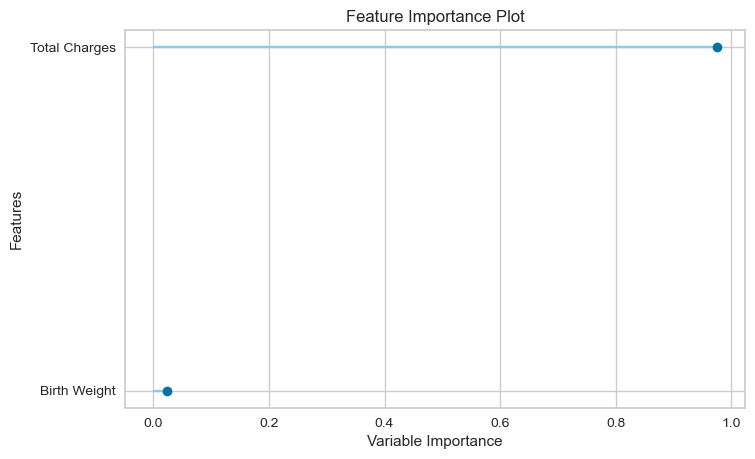

In [146]:
plot_model(exp4_rf,'feature',use_train_data=False)

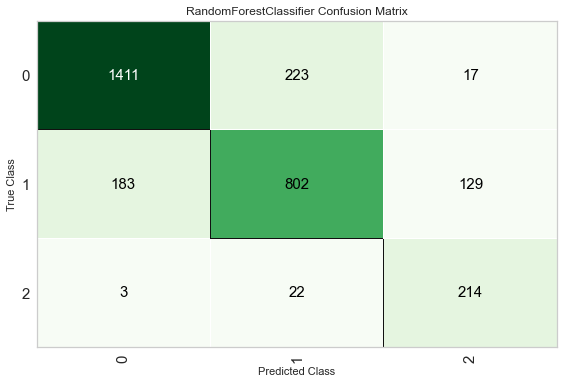

In [147]:
plot_model(exp4_rf,'confusion_matrix',use_train_data=False)

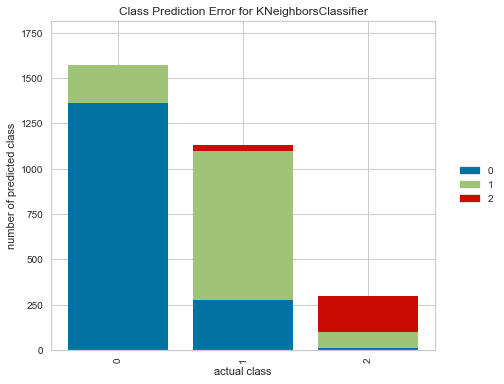

In [148]:
plot_model(exp4_knn,'error',use_train_data=False)

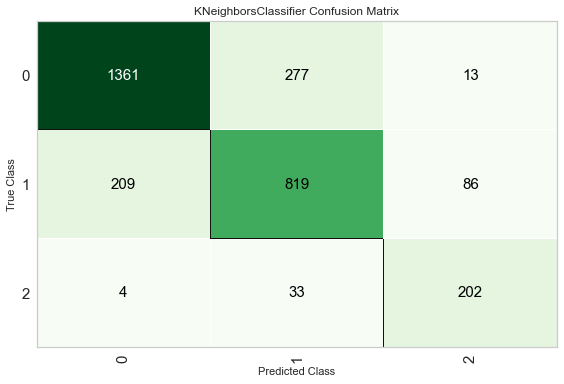

In [149]:
plot_model(exp4_knn,'confusion_matrix',use_train_data=False)

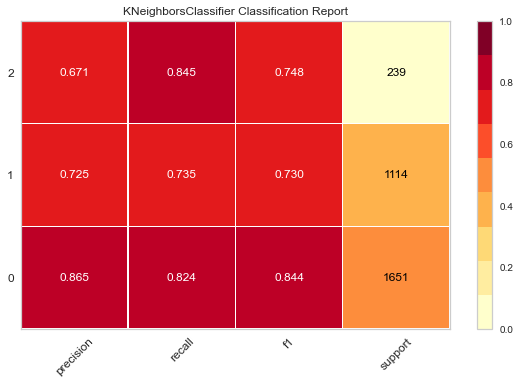

In [150]:
plot_model(exp4_knn,'class_report',use_train_data=False)

In [153]:
# Experiment 5 compare all available  pycaret models
from pycaret.classification import *

In [155]:
cls_features=setup(data[impcol],target='LOS Class 1',fix_imbalance=True,feature_selection=True,
                   data_split_stratify=True,fold=5)

,Description,Value
0,session_id,5014
1,Target,LOS Class 1
2,Target Type,Multiclass
3,Label Encoded,None
4,Original Data,"(10737, 26)"
5,Missing Values,False
6,Numeric Features,25
7,Categorical Features,0
8,Ordinal Features,False
9,High Cardinality Features,False


In [157]:
exp5_model=compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
gbc,Gradient Boosting Classifier,0.8337,0.9206,0.8342,0.8364,0.8344,0.6978,0.6984,1.9140
lightgbm,Light Gradient Boosting Machine,0.8275,0.9159,0.8199,0.8282,0.8277,0.6842,0.6843,0.3500
rf,Random Forest Classifier,0.8068,0.9041,0.8027,0.8081,0.8072,0.6471,0.6474,0.4940
dt,Decision Tree Classifier,0.7908,0.8148,0.7805,0.7945,0.7921,0.6207,0.6212,0.0460
knn,K Neighbors Classifier,0.7823,0.8720,0.7919,0.7898,0.7843,0.6099,0.6111,0.6460
et,Extra Trees Classifier,0.7755,0.8851,0.7692,0.7774,0.7761,0.5905,0.5909,0.3060
lr,Logistic Regression,0.7180,0.7795,0.7392,0.7183,0.7177,0.4855,0.4857,0.9140
nb,Naive Bayes,0.7095,0.7766,0.6932,0.7030,0.6885,0.4331,0.4539,0.0260
ada,Ada Boost Classifier,0.6420,0.7469,0.7167,0.7155,0.6432,0.3982,0.4305,0.2460
ridge,Ridge Classifier,0.6005,0.0000,0.6402,0.5941,0.5780,0.2765,0.2865,0.0340


In [158]:
exp5_model

GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=100,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=5014, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

In [161]:
predict_model(exp5_model,data=data_unseen)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Gradient Boosting Classifier,0.8326,0.9228,0.8257,0.8342,0.8332,0.6936,0.6938


,Length of Stay,Birth Weight,Total Charges,Total Costs,Hospital County_Kings,Hospital County_Manhattan,Hospital County_Queens,Hospital County_Richmond,Facility Name_Bronx-Lebanon Hospital Center - Concourse Division,Facility Name_Brookdale Hospital Medical Center,...,Payment Typology 1_Medicare,Payment Typology 1_Miscellaneous/Other,Payment Typology 1_Private Health Insurance,Payment Typology 1_Self-Pay,Payment Typology 1_Unknown,Emergency Department Indicator_Y,LOS Class 1,LOS Class 2,Label,Score
0,4,2400,16435.00,1720.74,0,1,0,0,0,0,...,0,0,0,0,0,0,1,1,1,0.6939
1,4,2100,23201.15,2553.12,0,1,0,0,0,0,...,0,0,0,0,0,0,1,1,1,0.6250
2,1,3400,4205.00,438.67,0,1,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0.5624
3,20,2200,213770.86,89779.95,0,1,0,0,0,0,...,0,0,0,0,0,0,2,1,2,0.9954
4,9,1800,95689.76,40145.55,0,1,0,0,0,0,...,0,0,1,0,0,0,2,1,2,0.9767
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96624,2,2800,9959.72,1510.93,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0.9177
96625,13,1600,192543.12,32271.66,0,0,1,0,0,0,...,0,0,1,0,0,0,2,1,2,0.9941
96626,2,3100,11000.36,1643.23,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0.8760
96627,2,2400,10594.70,1930.85,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0.7205


In [163]:
# Model Deployment
import joblib

In [164]:
# exporting best model from exp 3
joblib.dump(exp4_rf,"d:/exprrf.pkl")

['d:/exprrf.pkl']

In [170]:
data.head()

,Length of Stay,Birth Weight,Total Charges,Total Costs,Hospital County_Kings,Hospital County_Manhattan,Hospital County_Queens,Hospital County_Richmond,Facility Name_Bronx-Lebanon Hospital Center - Concourse Division,Facility Name_Brookdale Hospital Medical Center,...,"Payment Typology 1_Managed Care, Unspecified",Payment Typology 1_Medicaid,Payment Typology 1_Medicare,Payment Typology 1_Miscellaneous/Other,Payment Typology 1_Private Health Insurance,Payment Typology 1_Self-Pay,Payment Typology 1_Unknown,Emergency Department Indicator_Y,LOS Class 1,LOS Class 2
0,2,4000,9979.95,1518.35,0,0,1,0,0,0,...,0,0,0,0,1,0,0,0,0,0
1,15,2100,277940.91,90917.33,0,1,0,0,0,0,...,0,0,0,0,1,0,0,0,2,1
2,2,2900,11503.96,663.67,0,1,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
3,2,3200,12060.46,878.75,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,4,3000,18430.36,2399.20,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,1,1


In [165]:
# Experiment 6 compare all available  pycaret models
from pycaret.regression import *

In [172]:
reg_features=setup(data,target='Length of Stay')

,Description,Value
0,session_id,2482
1,Target,Length of Stay
2,Original Data,"(10737, 300)"
3,Missing Values,False
4,Numeric Features,297
5,Categorical Features,2
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(7515, 298)"


In [173]:
m=compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,0.2899,3.3473,1.7447,0.9575,0.0678,0.0250,2.3610
rf,Random Forest Regressor,0.3131,3.6339,1.8233,0.9547,0.0678,0.0235,2.2400
gbr,Gradient Boosting Regressor,0.3889,3.9336,1.8996,0.9501,0.1034,0.0714,1.4500
lightgbm,Light Gradient Boosting Machine,0.3763,4.2493,1.9777,0.9469,0.0870,0.0482,0.3190
knn,K Neighbors Regressor,0.5631,5.2985,2.2485,0.9302,0.1557,0.1077,0.2890
dt,Decision Tree Regressor,0.3904,6.1882,2.3611,0.9182,0.0926,0.0273,0.0630
ridge,Ridge Regression,0.7590,7.7498,2.7284,0.8878,0.1910,0.1902,0.0430
br,Bayesian Ridge,0.7748,9.5092,3.0231,0.8525,0.1900,0.1862,0.2260
omp,Orthogonal Matching Pursuit,0.7361,10.2523,3.1352,0.8387,0.1711,0.1592,0.0480
lasso,Lasso Regression,1.3968,15.0115,3.7503,0.7719,0.3491,0.4363,0.0860


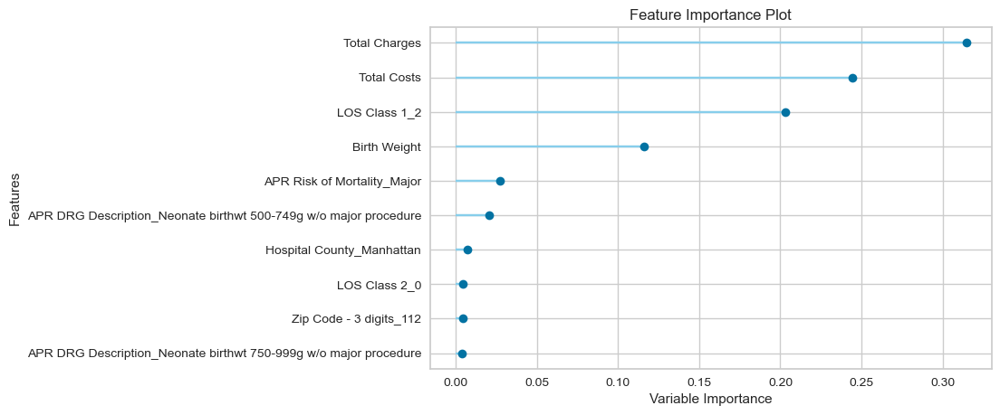

In [174]:
plot_model(m,'feature',use_train_data=False)

In [180]:
top_feature=["Total Charges","Birth Weight","APR Risk of Mortality_Major","Length of Stay"]

In [181]:
reg_features=setup(data[top_feature],target='Length of Stay')

,Description,Value
0,session_id,4358
1,Target,Length of Stay
2,Original Data,"(10737, 4)"
3,Missing Values,False
4,Numeric Features,3
5,Categorical Features,0
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(7515, 3)"


In [182]:
mdl=create_model(rf)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.7380,4.9215,2.2185,0.9238,0.2439,0.1881
1,1.0332,21.2141,4.6059,0.8303,0.2480,0.1990
2,1.0731,12.1449,3.4850,0.8455,0.2804,0.2244
3,0.8989,8.2926,2.8797,0.8665,0.2719,0.2162
4,0.8085,7.3457,2.7103,0.8490,0.2586,0.2034
5,1.0373,15.5726,3.9462,0.7983,0.2597,0.2208
6,1.0493,17.1425,4.1403,0.7163,0.2551,0.1908
7,0.9867,10.2889,3.2076,0.8824,0.2669,0.1943
8,0.8921,9.9574,3.1555,0.8559,0.2512,0.1939


In [191]:
predict_model(mdl,data=data_unseen[top_feature])

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,RandomForestClassifier,1.0261,16.7329,4.0906,0.7707,0.2678,0.2045


IndexError: index 120 is out of bounds for axis 0 with size 85

In [192]:
joblib.dump(mdl,"d:reg.pkl")

['d:reg.pkl']

In [194]:
data_unseen[top_feature]["Length of Stay"].max()

120